# 5 - Spatial chunk strategies

Compares how the spatially-chunked U-Net behaves under different **patch strategies**, evaluated with
the **fake-cloud (self-supervised) metric** rather than against Copernicus L4, because that is what we
will have at PACE. For each strategy we hide a set of observed Level-3 pixels (`fake_cloud_flag`), predict
them, and measure the error there.

**Training strategies** (one model each, trained in its own subprocess so the GPU context resets):
`whole` (no patching, control), `nonoverlap` 40x56, `overlap` 40x56, `patch80` 80x112, `random` 40x56 crops.

**Inference strategy** (eval-only, applied to one model): whole-region pass vs tiled-and-stitched (hard
seams vs overlap-blend). This is the real PACE-scale question, since the global domain will not fit in one
forward pass.

Same Arab Sea region, `features=[]`, and train/val/test split as notebook 4, so the `whole` control lines
up with nb4's whole-domain runs.

In [13]:
import os, pickle, base64
import numpy as np, xarray as xr, pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import cartopy.crs as ccrs, cartopy.feature as cfeature
import mindthegap as mtg

RECHUNKED = "/home/jovyan/shared-public/mindthegap/data/IO_rechunked.zarr"
ORIGINAL  = os.path.expanduser("~/shared/mind_the_chl_gap/IO.zarr")

SUBSET = dict(lat=slice(25, 5), lon=slice(50, 78))     # 27% land, clean 80x112, keeps Oman + W-India coasts

features = []
train_year, train_range, val_range, test_range = 2015, 3, 1, 1
TEST_YEAR = train_year + train_range + val_range        # 2019
DAY_BATCH = 100
SEED = 0

MODEL_DIR  = "models/spatial_strat"
DATADIR    = "data"
ZARR_LABEL = "spatial_strat"
os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(DATADIR, exist_ok=True)

# strategy table (single source of truth). sampling in {grid, random, coast}; all use the masked loss.
# grid: fixed tiles (tile+overlap). random: n_per_day uniform crops (>= min_ocean ocean).
# coast: n_per_day crops with an edge on the shoreline, mixed coast_frac with ocean crops.
STRATS = {
    "nonoverlap":   dict(tile=(40, 56), overlap=(0, 0),   batch=16, sampling="grid"),
    "overlap":      dict(tile=(40, 56), overlap=(20, 28), batch=16, sampling="grid"),
    "random":       dict(tile=(40, 56), n_per_day=16, batch=16, sampling="random", min_ocean=0.0),
    "ocean_random": dict(tile=(40, 56), n_per_day=16, batch=16, sampling="random", min_ocean=0.5),
    "coast":        dict(tile=(40, 56), n_per_day=16, batch=16, sampling="coast", coast_frac=0.5, min_ocean=0.5),
}
SEEDS = [0, 1, 2]

def open_region(path):
    ds = xr.open_zarr(path, chunks={})
    if SUBSET is not None:
        ds = ds.sel(**SUBSET)
    ds = mtg.crop_to_multiple(ds, multiple=8)
    t_lo = f"{train_year}-01-01"
    t_hi = f"{train_year+train_range+val_range+test_range}-01-01"
    return ds.sel(time=slice(t_lo, t_hi))

In [16]:
# shared stats + sidecar (mtg.viz.plot_prediction_observed reads {DATADIR}/{ZARR_LABEL}.npy)
orig = open_region(ORIGINAL)
LAT_FULL, LON_FULL = orig.sizes["lat"], orig.sizes["lon"]
print("grid:", dict(orig.sizes), " full:", (LAT_FULL, LON_FULL))

_, SHARED_STATS = mtg.build_standardized_lazy(orig, features, train_year, train_range,
                                              standardize_chl=True)
np.save(f"{DATADIR}/{ZARR_LABEL}.npy", SHARED_STATS, allow_pickle=True)
y_mean, y_std = SHARED_STATS["CHL"][0], SHARED_STATS["CHL"][1]
print("saved stats sidecar ->", f"{DATADIR}/{ZARR_LABEL}.npy", " CHL mean/std:", y_mean, y_std)

grid: {'time': 1827, 'lat': 80, 'lon': 112}  full: (80, 112)
saved stats sidecar -> data/spatial_strat.npy  CHL mean/std: -1.24626 0.9202031


In [17]:
# coverage diagnostic (cheap, run BEFORE the expensive trainings)
# xbatcher drops partial edge tiles, so non-overlapping tiles that do not divide the region
# leave a strip untrained. This makes each strategy's spatial coverage explicit.
def coverage(LAT, LON, tile, overlap):
    if tile is None:
        return dict(tiles=(1, 1), covered=(LAT, LON), frac=1.0)
    th, tw = tile; oh, ow = overlap or (0, 0)
    sh, sw = th - oh, tw - ow
    n_h = (LAT - th) // sh + 1 if LAT >= th else 0
    n_w = (LON - tw) // sw + 1 if LON >= tw else 0
    cov_h = (n_h - 1) * sh + th if n_h else 0
    cov_w = (n_w - 1) * sw + tw if n_w else 0
    return dict(tiles=(n_h, n_w), covered=(cov_h, cov_w), frac=(cov_h * cov_w) / (LAT * LON))

print(f"region {LAT_FULL}x{LON_FULL}\n")
print(f"{'strategy':>12} {'tiles':>8} {'covered':>12} {'coverage':>9}")
for name, S in STRATS.items():
    if S["sampling"] in ("random", "coast"):
        print(f"{name:>12} {'random':>8} {'~full':>12} {'~100%':>9}   "
              f"({S['n_per_day']} crops/day, tile {S['tile']})")
        continue
    cov = coverage(LAT_FULL, LON_FULL, S["tile"], S["overlap"])
    print(f"{name:>12} {str(cov['tiles']):>8} {str(cov['covered']):>12} {cov['frac']*100:8.1f}%")

region 80x112

    strategy    tiles      covered  coverage
       whole   (1, 1)    (80, 112)    100.0%
  nonoverlap   (2, 2)    (80, 112)    100.0%
     overlap   (3, 3)    (80, 112)    100.0%
overlap_small   (2, 2)    (76, 106)     89.9%
      random   random        ~full     ~100%   (16 crops/day, tile (40, 56))


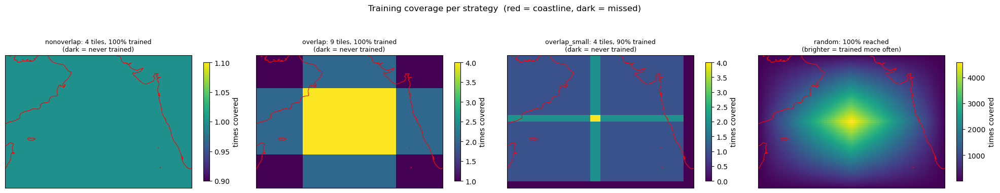

In [18]:
import numpy as np, matplotlib.pyplot as plt
import cartopy.crs as ccrs, cartopy.feature as cfeature
LAT, LON = LAT_FULL, LON_FULL
EXT = [float(orig.lon.min()), float(orig.lon.max()), float(orig.lat.min()), float(orig.lat.max())]

def grid_cover(tile, overlap):
    th, tw = tile; oh, ow = overlap or (0, 0); sh, sw = th-oh, tw-ow
    n_h = (LAT-th)//sh + 1; n_w = (LON-tw)//sw + 1
    cov = np.zeros((LAT, LON), int)
    for i in range(n_h):
        for j in range(n_w):
            cov[i*sh:i*sh+th, j*sw:j*sw+tw] += 1
    return cov, n_h*n_w

def random_cover(tile, npd, ndays, seed=0):
    th, tw = tile; rng = np.random.default_rng(seed); cov = np.zeros((LAT, LON), int)
    for _ in range(npd*ndays):
        yy = int(rng.integers(0, LAT-th+1)); xx = int(rng.integers(0, LON-tw+1))
        cov[yy:yy+th, xx:xx+tw] += 1
    return cov

grids = [(n, S) for n, S in STRATS.items() if S["sampling"] == "grid" and S["tile"]]
fig, axes = plt.subplots(1, len(grids)+1, figsize=(5*(len(grids)+1), 4.5),
                         subplot_kw={"projection": ccrs.PlateCarree()})
for ax, (name, S) in zip(axes, grids):
    cov, nt = grid_cover(S["tile"], S["overlap"]); frac = (cov > 0).mean()
    im = ax.imshow(cov, extent=EXT, origin="upper", transform=ccrs.PlateCarree(),
                   cmap="viridis", interpolation="nearest")
    ax.add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor="red")
    ax.set_title(f"{name}: {nt} tiles, {frac:.0%} trained\n(dark = never trained)", size=9)
    fig.colorbar(im, ax=ax, shrink=0.6, label="times covered")
cov = random_cover((40, 56), 16, 300); frac = (cov > 0).mean()
im = axes[-1].imshow(cov, extent=EXT, origin="upper", transform=ccrs.PlateCarree(),
                     cmap="viridis", interpolation="nearest")
axes[-1].add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor="red")
axes[-1].set_title(f"random: {frac:.0%} reached\n(brighter = trained more often)", size=9)
fig.colorbar(im, ax=axes[-1], shrink=0.6, label="times covered")
plt.suptitle("Training coverage per strategy  (red = coastline, dark = missed)", size=12)
plt.tight_layout(); plt.show()


yy ~ U{0..40} (41),  xx ~ U{0..56} (57)  ->  2,337 distinct positions, 16/day
P(two crops identical): 0.04%
P(>=1 identical pair among 16/day): 5.0%
pairwise IoU: mean 0.31, median 0.27, P(>0.5)=18.4%, P(=0 disjoint)=0.2%
single-crop coverage prob: center 0.958, corner 0.00043, ratio 2240x


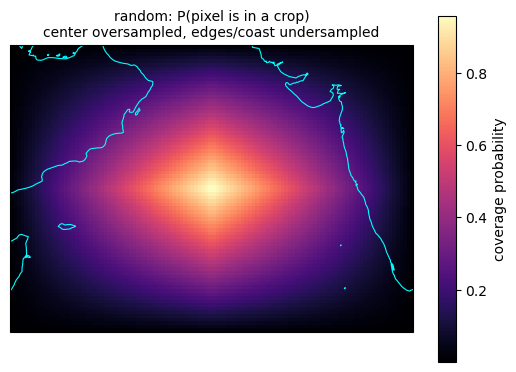

In [19]:
LAT, LON, th, tw, npd = LAT_FULL, LON_FULL, 40, 56, 16
ny, nx = LAT-th+1, LON-tw+1
print(f"yy ~ U{{0..{ny-1}}} ({ny}),  xx ~ U{{0..{nx-1}}} ({nx})  ->  {ny*nx:,} distinct positions, {npd}/day")
print(f"P(two crops identical): {1/(ny*nx):.2%}")
print(f"P(>=1 identical pair among {npd}/day): {1-np.exp(-npd*(npd-1)/2/(ny*nx)):.1%}")
rng = np.random.default_rng(0); N = 50000
y = rng.integers(0, ny, (N, 2)); x = rng.integers(0, nx, (N, 2))
oy = np.maximum(0, th-np.abs(y[:,0]-y[:,1])); ox = np.maximum(0, tw-np.abs(x[:,0]-x[:,1]))
inter = oy*ox; iou = inter/(2*th*tw-inter)
print(f"pairwise IoU: mean {iou.mean():.2f}, median {np.median(iou):.2f}, "
      f"P(>0.5)={(iou>0.5).mean():.1%}, P(=0 disjoint)={(iou==0).mean():.1%}")
rows = np.array([min(LAT-th, r)-max(0, r-th+1)+1 for r in range(LAT)]) / ny
cols = np.array([min(LON-tw, c)-max(0, c-tw+1)+1 for c in range(LON)]) / nx
P = np.outer(rows, cols)
print(f"single-crop coverage prob: center {P.max():.3f}, corner {P.min():.5f}, ratio {P.max()/P.min():.0f}x")
fig, ax = plt.subplots(figsize=(6.5, 4.5), subplot_kw={"projection": ccrs.PlateCarree()})
im = ax.imshow(P, extent=EXT, origin="upper", transform=ccrs.PlateCarree(), cmap="magma")
ax.add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor="cyan")
ax.set_title("random: P(pixel is in a crop)\ncenter oversampled, edges/coast undersampled", size=10)
fig.colorbar(im, ax=ax, label="coverage probability"); plt.show()


In [20]:
chlvar = "CHL" if "CHL" in orig else [v for v in orig.data_vars if "CHL" in v.upper()][0]
land = orig[chlvar].isnull().all("time").values          # always-NaN = land
print(f"domain: {land.mean():.0%} land / {(~land).mean():.0%} ocean\n")
print(f"{'strategy':>13} {'covered is %land':>16} {'% of ocean trained':>20}")
for name, S in STRATS.items():
    if S["sampling"] == "grid" and S["tile"]:
        cov, _ = grid_cover(S["tile"], S["overlap"]); reg = cov > 0
        print(f"{name:>13} {land[reg].mean():15.0%} {(reg & ~land).sum()/(~land).sum():19.0%}")


domain: 27% land / 73% ocean

     strategy covered is %land   % of ocean trained
   nonoverlap             27%                100%
      overlap             27%                100%
overlap_small             25%                 92%


In [9]:
full = xr.open_zarr(ORIGINAL, chunks={})
chlvar = "CHL" if "CHL" in full else [v for v in full.data_vars if "CHL" in v.upper()][0]
print("full IO domain:", dict(full.sizes),
      f"lat [{float(full.lat.min()):.0f},{float(full.lat.max()):.0f}] "
      f"lon [{float(full.lon.min()):.0f},{float(full.lon.max()):.0f}]\n")
oneyr = full.sel(time="2019")     # a year of clouds reveals all ocean; NaN-all-year = land
def region_stats(lat_hi, lat_lo, lon_lo, lon_hi):
    s = mtg.crop_to_multiple(oneyr.sel(lat=slice(lat_hi, lat_lo), lon=slice(lon_lo, lon_hi)), multiple=8)
    land = s[chlvar].isnull().all("time").values
    print(f"  lat({lat_hi:>2},{lat_lo:>2}) lon({lon_lo:>2},{lon_hi:>2})  "
          f"{str(dict(s.sizes)):<32} land {land.mean():4.0%}   ocean px {int((~land).sum()):>7,}")
region_stats(31, 5, 42, 80)     # current (53% land)
region_stats(25, 5, 50, 78)     # drop NW Arabia + the far north
region_stats(22, 3, 55, 78)     # open Arabian Sea + W-India shelf
region_stats(20, 0, 52, 75)     # ocean-heavy, keeps Somali/Oman/India coasts


full IO domain: {'time': 16071, 'lat': 177, 'lon': 241} lat [-12,32] lon [42,102]

  lat(31, 5) lon(42,80)  {'time': 365, 'lat': 104, 'lon': 152} land  53%   ocean px   7,353
  lat(25, 5) lon(50,78)  {'time': 365, 'lat': 80, 'lon': 112} land  27%   ocean px   6,521
  lat(22, 3) lon(55,78)  {'time': 365, 'lat': 72, 'lon': 88} land  14%   ocean px   5,463
  lat(20, 0) lon(52,75)  {'time': 365, 'lat': 80, 'lon': 88} land   5%   ocean px   6,713


In [7]:
%%writefile train_strat.py
"""Train one spatial-chunk strategy in its own process (fresh GPU each run).
Driven by nb5's subprocess loop:  python train_strat.py --strategy <name>
Uses the mindthegap package (mtg.UNet / mtg.make_xbatcher), so the package with those
additions must be installed on the Hub."""
import os, argparse, pickle
os.environ.pop("TF_CUDNN_DETERMINISTIC", None)   # match the working notebooks
os.environ.pop("TF_CUDNN_USE_AUTOTUNE", None)
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

import numpy as np, xarray as xr, tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
import mindthegap as mtg


def open_region(path, c):
    ds = xr.open_zarr(path, chunks={})
    if c["SUBSET"] is not None:
        ds = ds.sel(**c["SUBSET"])
    ds = mtg.crop_to_multiple(ds, multiple=8)
    ty, tr, vr, te = c["train_year"], c["train_range"], c["val_range"], c["test_range"]
    return ds.sel(time=slice(f"{ty}-01-01", f"{ty+tr+vr+te}-01-01"))


ap = argparse.ArgumentParser()
ap.add_argument("--strategy", required=True)
ap.add_argument("--config", default="models/spatial_strat/strat_config.pkl")
a = ap.parse_args()
c = pickle.load(open(a.config, "rb"))
S = c["STRATS"][a.strategy]

for g in tf.config.list_physical_devices("GPU"):
    tf.config.experimental.set_memory_growth(g, True)
tf.keras.utils.set_random_seed(c["SEED"])

# standardized train..test window, shared stats so every strategy sees identical inputs
ds = open_region(c["ORIGINAL"], c)
ty, tr, vr = c["train_year"], c["train_range"], c["val_range"]
LAT, LON = ds.sizes["lat"], ds.sizes["lon"]
ds_std, _ = mtg.build_standardized_lazy(
    ds, c["features"], ty, tr, standardize_chl=True, stats=c["SHARED_STATS"],
    output_chunks={"time": c["DAY_BATCH"], "lat": LAT, "lon": LON})
x_vars = [v for v in ds_std.data_vars if v != "CHL"]
NC = len(x_vars)

dtr = ds_std.sel(time=slice(f"{ty}-01-01", f"{ty+tr}-01-01")).load()
dva = ds_std.sel(time=slice(f"{ty+tr}-01-01", f"{ty+tr+vr}-01-01")).load()
batch = S["batch"]
sig = lambda th, tw: (tf.TensorSpec((th, tw, NC), tf.float32),
                      tf.TensorSpec((th, tw, 1), tf.float32))

if S["sampling"] == "grid":
    # whole-domain when tile is None; else fixed tiles, optionally overlapping
    th, tw = S["tile"] if S["tile"] else (LAT, LON)
    oh, ow = S["overlap"] if S["overlap"] else (0, 0)
    patch_dims = {"time": c["DAY_BATCH"], "lat": th, "lon": tw}
    overlap = None if (oh, ow) == (0, 0) else {"time": 0, "lat": oh, "lon": ow}
    btr = mtg.make_xbatcher(dtr, patch_dims, overlap=overlap)
    bva = mtg.make_xbatcher(dva, patch_dims, overlap=overlap)
    trds = tf.data.Dataset.from_generator(mtg.make_tf_gen(btr, x_vars), output_signature=sig(th, tw)
        ).shuffle(512, seed=c["SEED"]).batch(batch).repeat().prefetch(tf.data.AUTOTUNE)
    vads = tf.data.Dataset.from_generator(mtg.make_tf_gen(bva, x_vars), output_signature=sig(th, tw)
        ).batch(batch).repeat().prefetch(tf.data.AUTOTUNE)
    steps_tr = (len(btr) * c["DAY_BATCH"]) // batch
    steps_va = (len(bva) * c["DAY_BATCH"]) // batch
    print(f"[{a.strategy}] grid tile {th}x{tw} overlap {(oh, ow)}  "
          f"blocks train {len(btr)} val {len(bva)}  steps {steps_tr}/{steps_va}", flush=True)
else:
    # random crops: sample n_per_day windows anywhere in the region each day
    th, tw = S["tile"]
    npd = S["n_per_day"]

    def to_arr(dd):
        X = np.stack([np.nan_to_num(dd[v].values, nan=0.0) for v in x_vars], -1).astype(np.float32)
        y = np.nan_to_num(dd["CHL"].values, nan=0.0).astype(np.float32)[..., np.newaxis]
        return X, y

    def crop_gen(Xf, yf, seed):
        rng = np.random.default_rng(seed)
        def g():
            D, H, W, _ = Xf.shape
            for d in range(D):
                for _ in range(npd):
                    yy = int(rng.integers(0, H - th + 1))
                    xx = int(rng.integers(0, W - tw + 1))
                    yield Xf[d, yy:yy+th, xx:xx+tw], yf[d, yy:yy+th, xx:xx+tw]
        return g

    Xtr, ytr = to_arr(dtr)
    Xva, yva = to_arr(dva)
    trds = tf.data.Dataset.from_generator(crop_gen(Xtr, ytr, c["SEED"]), output_signature=sig(th, tw)
        ).shuffle(512, seed=c["SEED"]).batch(batch).repeat().prefetch(tf.data.AUTOTUNE)
    vads = tf.data.Dataset.from_generator(crop_gen(Xva, yva, c["SEED"] + 1), output_signature=sig(th, tw)
        ).batch(batch).repeat().prefetch(tf.data.AUTOTUNE)
    steps_tr = (Xtr.shape[0] * npd) // batch
    steps_va = (Xva.shape[0] * npd) // batch
    print(f"[{a.strategy}] random {npd} crops/day tile {th}x{tw}  steps {steps_tr}/{steps_va}", flush=True)

model = mtg.UNet((None, None, NC))
es = EarlyStopping(patience=10, restore_best_weights=True)
model.fit(trds, epochs=50, steps_per_epoch=steps_tr,
          validation_data=vads, validation_steps=steps_va, callbacks=[es], verbose=2)
out = f'{c["MODEL_DIR"]}/{a.strategy}.keras'
model.save(out)
print("SAVED", out)


Overwriting train_strat.py


In [37]:
# Retry ONLY the strategy listed, the other four are already trained and saved, so we
# must not overwrite them. (The skip-existing check below is a second guard.)
# To run every strategy again from scratch, set:  RETRY = list(STRATS)
import sys, subprocess
RETRY = ["overlap_small"]

# still pickle the FULL strategy table so train_strat.py picks up patch80's new batch=2
cfg = dict(SUBSET=SUBSET, train_year=train_year, train_range=train_range, val_range=val_range,
           test_range=test_range, features=features, DAY_BATCH=DAY_BATCH, SEED=SEED,
           ORIGINAL=ORIGINAL, RECHUNKED=RECHUNKED, MODEL_DIR=MODEL_DIR,
           SHARED_STATS=SHARED_STATS, STRATS=STRATS)
pickle.dump(cfg, open(f"{MODEL_DIR}/strat_config.pkl", "wb"))

for name in RETRY:
    out = f"{MODEL_DIR}/{name}.keras"
    if os.path.exists(out):
        print("already trained, not overwriting:", out); continue
    print(f"\n===== training {name} =====", flush=True)
    rc = subprocess.run([sys.executable, "train_strat.py", "--strategy", name]).returncode
    print(f"----- {name} exited {rc} -----")
print("\ndone")


===== training overlap_small =====


2026-07-09 20:41:03.164070: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1783629663.183203   10120 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1783629663.189597   10120 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1783629663.203894   10120 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1783629663.203919   10120 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1783629663.203922   10120 computation_placer.cc:177] computation placer alr

[overlap_small] grid tile 40x56 overlap (4, 6)  blocks train 40 val 12  steps 250/75
Epoch 1/50
250/250 - 32s - 128ms/step - loss: 0.0442 - mae: 0.0975 - val_loss: 0.0266 - val_mae: 0.0624
Epoch 2/50
250/250 - 20s - 79ms/step - loss: 0.0198 - mae: 0.0573 - val_loss: 0.0220 - val_mae: 0.0557
Epoch 3/50
250/250 - 20s - 80ms/step - loss: 0.0167 - mae: 0.0496 - val_loss: 0.0189 - val_mae: 0.0510
Epoch 4/50
250/250 - 20s - 80ms/step - loss: 0.0151 - mae: 0.0454 - val_loss: 0.0175 - val_mae: 0.0469
Epoch 5/50
250/250 - 21s - 83ms/step - loss: 0.0138 - mae: 0.0413 - val_loss: 0.0166 - val_mae: 0.0448
Epoch 6/50
250/250 - 22s - 86ms/step - loss: 0.0134 - mae: 0.0404 - val_loss: 0.0162 - val_mae: 0.0483
Epoch 7/50
250/250 - 20s - 81ms/step - loss: 0.0126 - mae: 0.0380 - val_loss: 0.0160 - val_mae: 0.0461
Epoch 8/50
250/250 - 20s - 81ms/step - loss: 0.0139 - mae: 0.0432 - val_loss: 0.0157 - val_mae: 0.0389
Epoch 9/50
250/250 - 20s - 82ms/step - loss: 0.0120 - mae: 0.0345 - val_loss: 0.0154 - val

## Evaluation: fake-cloud

Everything below uses only the satellite's own Level-3 observation and the held-out fake-cloud pixels.

In [8]:
# standardized test-year inputs (built once, shared by all strategies)
orig_test = open_region(ORIGINAL).sel(time=str(TEST_YEAR))
ds_std_test, _ = mtg.build_standardized_lazy(orig_test, features, train_year, train_range,
                                             standardize_chl=True, stats=SHARED_STATS)
ds_std_test = ds_std_test.load()
_days = ds_std_test.time.values
DATES = pd.to_datetime(_days[np.linspace(0, len(_days) - 1, 10).astype(int)])
print("eval dates:", [str(d.date()) for d in DATES])
STRAT_PATHS = {name: f"{MODEL_DIR}/{name}.keras" for name in STRATS}

eval dates: ['2019-01-01', '2019-02-10', '2019-03-22', '2019-05-02', '2019-06-11', '2019-07-22', '2019-08-31', '2019-10-11', '2019-11-20', '2019-12-31']


In [9]:
# scalar fake-cloud error: compare prediction to true Level-3 at held-out fake-cloud pixels
def fake_cloud_scores(model, ds_std, dates):
    xv = [v for v in ds_std.data_vars if v != "CHL"]
    ae = se = n = 0.0
    for d in dates:
        sub = ds_std.sel(time=d)
        X = np.stack([np.nan_to_num(sub[v].values, nan=0.0) for v in xv], -1).astype(np.float32)
        pred  = mtg.unstdize(model.predict(X[np.newaxis, ...], verbose=0)[0, :, :, 0], y_mean, y_std)
        truth = mtg.unstdize(sub["CHL"].values, y_mean, y_std)
        m = (sub["fake_cloud_flag"].values == 1) & np.isfinite(truth) & np.isfinite(pred)
        diff = pred[m] - truth[m]
        ae += np.abs(diff).sum(); se += (diff ** 2).sum(); n += m.sum()
    return ae / n, np.sqrt(se / n), int(n)

print(f"{'strategy':>12} {'fake-cloud MAE':>15} {'RMSE':>9} {'n pix':>10}")
for name, p in STRAT_PATHS.items():
    if not os.path.exists(p):
        print(f"{name:>12} {'(missing)':>15}"); continue
    mae, rmse, n = fake_cloud_scores(tf.keras.models.load_model(p, compile=False), ds_std_test, DATES)
    print(f"{name:>12} {mae:15.4f} {rmse:9.4f} {n:10d}")

    strategy  fake-cloud MAE      RMSE      n pix


2026-07-10 16:50:01.306315: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2026-07-10 16:50:02.360381: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:549] Omitted potentially buggy algorithm eng14{k25=2} for conv %cudnn-conv-bias-activation.40 = (f32[1,256,26,38]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,128,26,38]{3,2,1,0} %bitcast.790, f32[256,128,3,3]{3,2,1,0} %bitcast.797, f32[256]{0} %bitcast.799), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", metadata={op_type="Conv2D" op_name="U-net_1/conv2d_4_1/convolution" source_file="/srv/conda/envs/notebook/lib/python3.12/site-packages/tensorflow/python/framework/ops.py" source_line=1200}, backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"side_in

       whole          0.2663    0.4184      23420
  nonoverlap          0.2403    0.3551      23420
     overlap          0.2519    0.4442      23420
overlap_small          0.2443    0.3679      23420
      random          0.2169    0.3370      23420


2026-07-10 17:13:32.094100: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:549] Omitted potentially buggy algorithm eng14{k25=2} for conv %cudnn-conv-bias-activation.36 = (f32[4,64,104,152]{3,2,1,0}, u8[0]{0}) custom-call(f32[4,9,104,152]{3,2,1,0} %bitcast.688, f32[64,9,3,3]{3,2,1,0} %bitcast.695, f32[64]{0} %bitcast.697), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", metadata={op_type="Conv2D" op_name="U-net_1/conv2d_1/convolution" source_file="/srv/conda/envs/notebook/lib/python3.12/site-packages/tensorflow/python/framework/ops.py" source_line=1200}, backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false}
2026-07-10 17:13:32.204466: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:549] Omitted potential

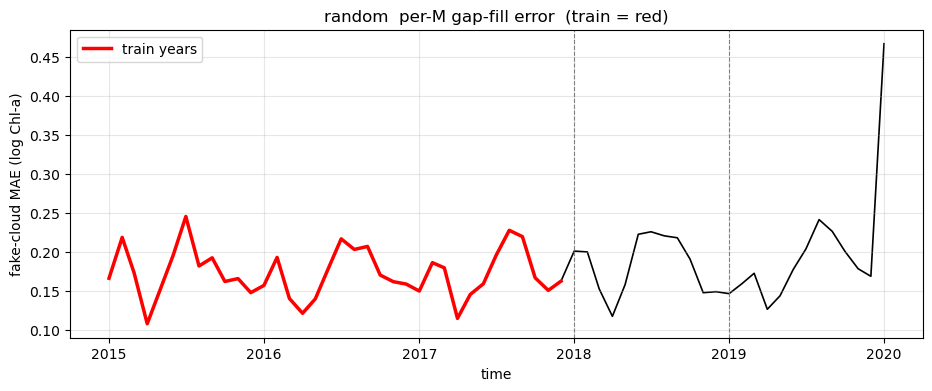

random  train 0.1722   val 0.1832   test 0.2006


In [12]:
# ---- setup: standardized data over the FULL train..test window (lazy; loaded per block) ----
orig_full_ds = open_region(ORIGINAL)                          # 2015-01-01 .. 2020-01-01
ds_std_full, _ = mtg.build_standardized_lazy(orig_full_ds, features, train_year, train_range,
                                             standardize_chl=True, stats=SHARED_STATS)
TRAIN_END = f"{train_year + train_range}-01-01"               # 2018-01-01 (train = 2015-2017)
VAL_END   = f"{train_year + train_range + val_range}-01-01"   # 2019-01-01

def daily_fake_cloud_mae(model, ds_std, block=100):
    """Per-day fake-cloud MAE over every day in ds_std (loaded in blocks to bound memory)."""
    xv = [v for v in ds_std.data_vars if v != "CHL"]
    times = pd.to_datetime(ds_std.time.values)
    out = np.full(len(times), np.nan)
    for s in range(0, len(times), block):
        sub = ds_std.isel(time=slice(s, s + block)).load()
        X = np.stack([np.nan_to_num(sub[v].values, nan=0.0) for v in xv], -1).astype(np.float32)
        pred = model.predict(X, batch_size=4, verbose=0)[..., 0] * y_std + y_mean
        truth = sub["CHL"].values * y_std + y_mean
        m = (sub["fake_cloud_flag"].values == 1) & np.isfinite(truth) & np.isfinite(pred)
        d = np.where(m, np.abs(pred - truth), np.nan)
        with np.errstate(invalid="ignore"):
            out[s:s + d.shape[0]] = np.nanmean(d.reshape(d.shape[0], -1), axis=1)
    return pd.Series(out, index=times)

def overall_perf(model, ds_std, freq="M", label=""):
    """Plot per-day/-month/-year fake-cloud error over time; train years in red. Returns the series."""
    ser = daily_fake_cloud_mae(model, ds_std).dropna()
    if freq in ("M", "Y"):
        ser = ser.groupby(ser.index.to_period(freq)).mean()
        ser.index = ser.index.to_timestamp()
    is_train = ser.index < pd.Timestamp(TRAIN_END)

    fig, ax = plt.subplots(figsize=(11, 4))
    ax.plot(ser.index, ser.values, color="black", lw=1.2, zorder=1)
    ax.plot(ser.index[is_train], ser.values[is_train], color="red", lw=2.5, zorder=2, label="train years")
    ax.axvline(pd.Timestamp(TRAIN_END), ls="--", c="gray", lw=0.8)
    ax.axvline(pd.Timestamp(VAL_END), ls="--", c="gray", lw=0.8)
    ax.set_xlabel("time"); ax.set_ylabel("fake-cloud MAE (log Chl-a)")
    ax.set_title(f"{label}  per-{freq} gap-fill error  (train = red)")
    ax.legend(); ax.grid(alpha=0.3); plt.show()

    tr = ser[is_train].mean()
    va = ser[(ser.index >= pd.Timestamp(TRAIN_END)) & (ser.index < pd.Timestamp(VAL_END))].mean()
    te = ser[ser.index >= pd.Timestamp(VAL_END)].mean()
    print(f"{label}  train {tr:.4f}   val {va:.4f}   test {te:.4f}")
    return ser

# example: one strategy (monthly). Loop over STRAT_PATHS for all of them.
_ = overall_perf(tf.keras.models.load_model(STRAT_PATHS["random"]), ds_std_full, freq="M", label="random")


/tmp/ipykernel_159/3038167265.py:20: RuntimeWarning: Mean of empty slice
  series[k][s:s + d.shape[0]] = np.nanmean(d.reshape(d.shape[0], -1), axis=1)


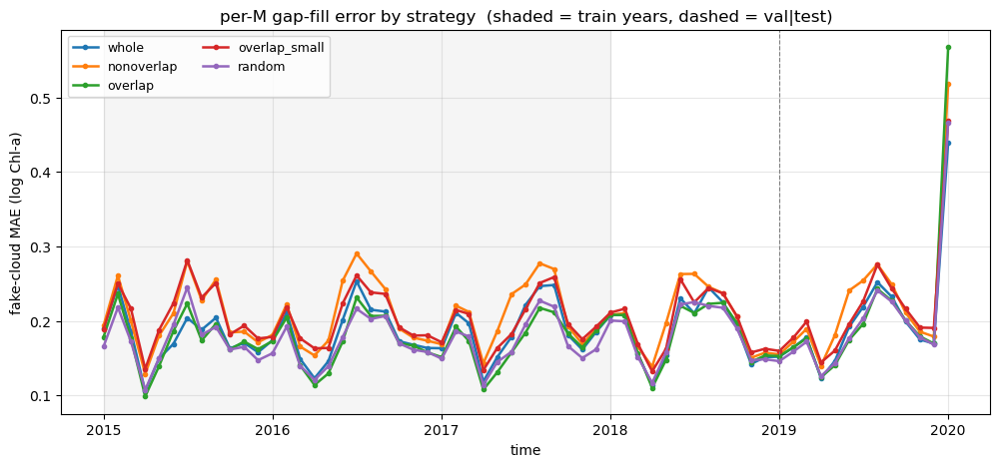

      strategy    train  after-train
         whole   0.1831       0.1953
    nonoverlap   0.2080       0.2159
       overlap   0.1735       0.1970
 overlap_small   0.2028       0.2093
        random   0.1722       0.1923


In [13]:
def compare_perf(models, ds_std, freq="M", block=100):
    """Overlay fake-cloud error over time, one line per strategy. Shaded band = train years.
    Loads each time block once and predicts all models on it, so the data is read only once."""
    models = {k: v for k, v in models.items() if os.path.exists(v)}
    mdls = {k: tf.keras.models.load_model(v) for k, v in models.items()}
    xv = [v for v in ds_std.data_vars if v != "CHL"]
    times = pd.to_datetime(ds_std.time.values)
    series = {k: np.full(len(times), np.nan) for k in mdls}

    for s in range(0, len(times), block):
        sub = ds_std.isel(time=slice(s, s + block)).load()
        X = np.stack([np.nan_to_num(sub[v].values, nan=0.0) for v in xv], -1).astype(np.float32)
        truth = sub["CHL"].values * y_std + y_mean
        fake = (sub["fake_cloud_flag"].values == 1) & np.isfinite(truth)
        for k, mdl in mdls.items():
            pred = mdl.predict(X, batch_size=4, verbose=0)[..., 0] * y_std + y_mean
            m = fake & np.isfinite(pred)
            d = np.where(m, np.abs(pred - truth), np.nan)
            with np.errstate(invalid="ignore"):
                series[k][s:s + d.shape[0]] = np.nanmean(d.reshape(d.shape[0], -1), axis=1)

    out = {}
    for k, arr in series.items():
        ser = pd.Series(arr, index=times).dropna()
        if freq in ("M", "Y"):
            ser = ser.groupby(ser.index.to_period(freq)).mean()
            ser.index = ser.index.to_timestamp()
        out[k] = ser

    fig, ax = plt.subplots(figsize=(12, 5))
    for k, ser in out.items():
        ax.plot(ser.index, ser.values, lw=1.8, marker="o", ms=3, label=k)
    ax.axvspan(pd.Timestamp(f"{train_year}-01-01"), pd.Timestamp(TRAIN_END), color="gray", alpha=0.08)
    ax.axvline(pd.Timestamp(VAL_END), ls="--", c="gray", lw=0.8)
    ax.set_xlabel("time"); ax.set_ylabel("fake-cloud MAE (log Chl-a)")
    ax.set_title(f"per-{freq} gap-fill error by strategy  (shaded = train years, dashed = val|test)")
    ax.legend(ncol=2, fontsize=9); ax.grid(alpha=0.3); plt.show()

    print(f"{'strategy':>14} {'train':>8} {'after-train':>12}")
    for k, ser in out.items():
        is_tr = ser.index < pd.Timestamp(TRAIN_END)
        print(f"{k:>14} {ser[is_tr].mean():8.4f} {ser[~is_tr].mean():12.4f}")
    return out

_ = compare_perf(STRAT_PATHS, ds_std_full, freq="M")


============================== whole ==============================


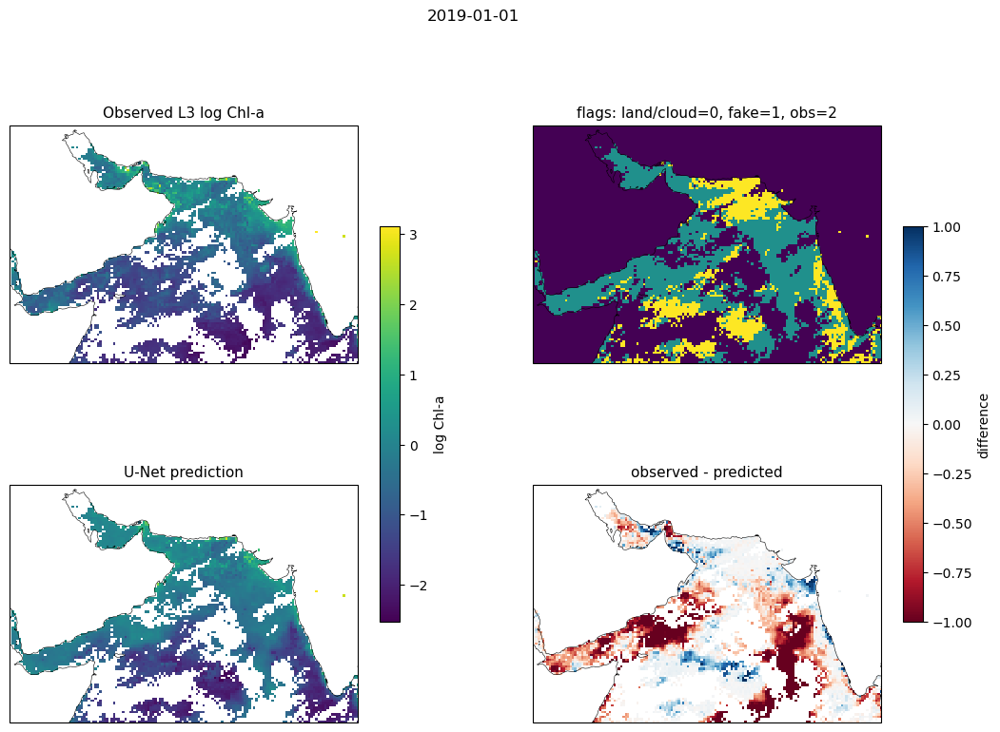

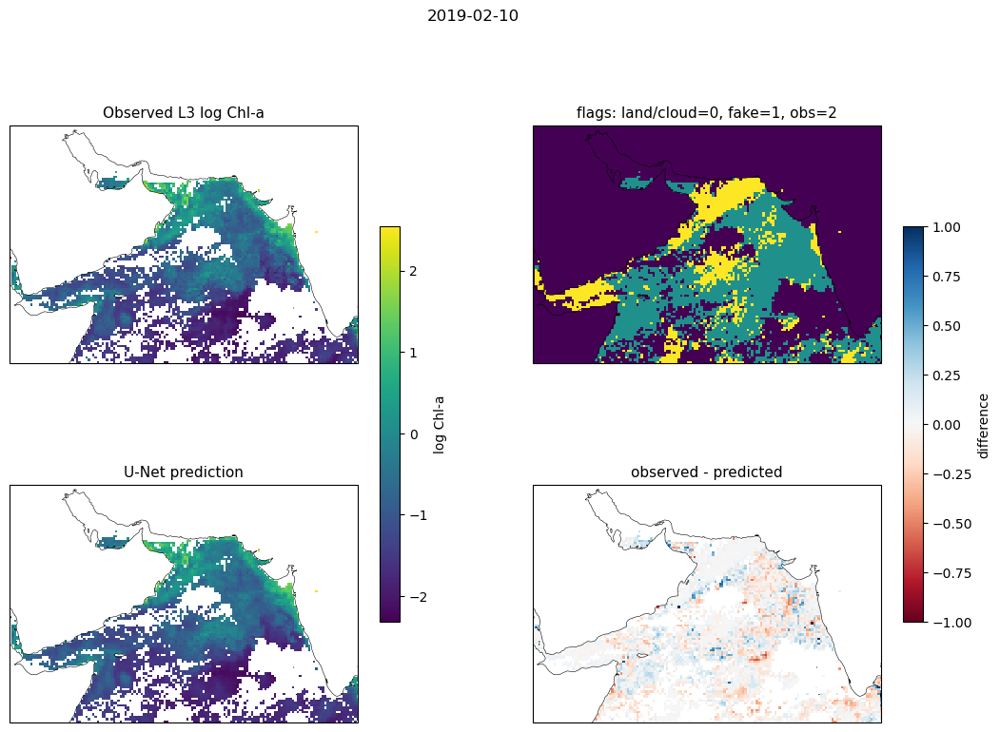

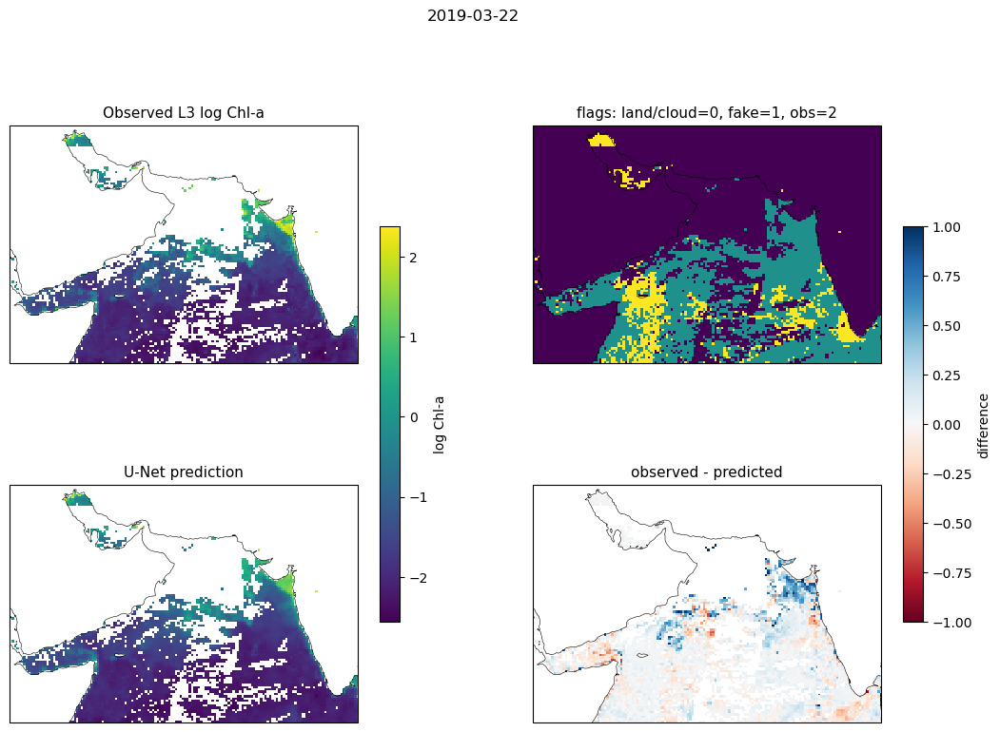

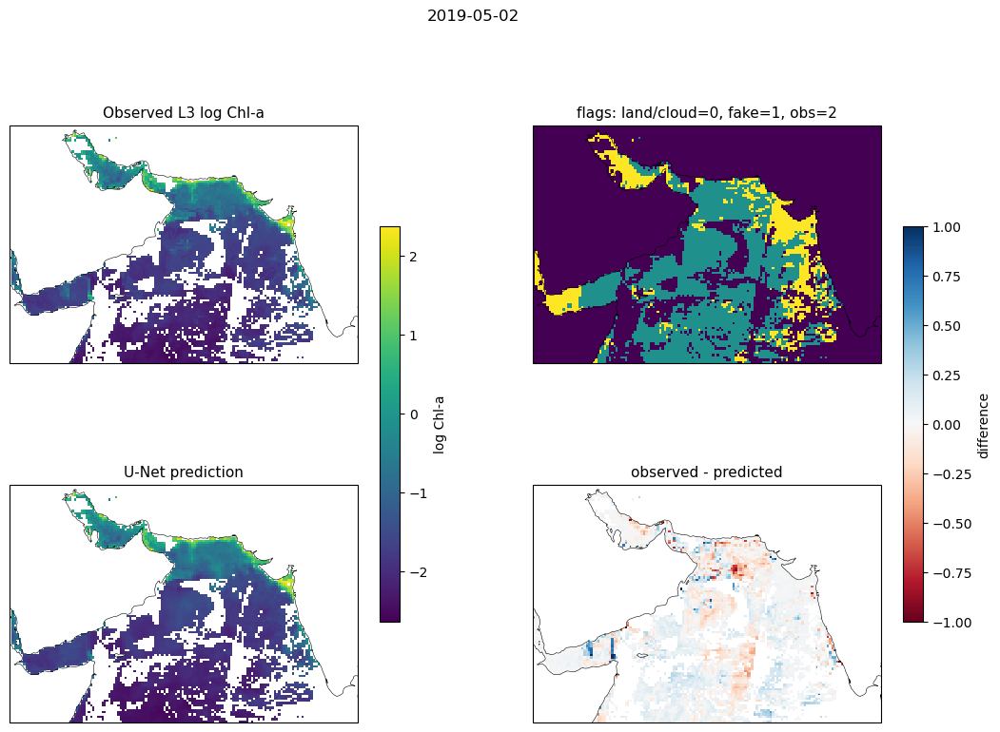

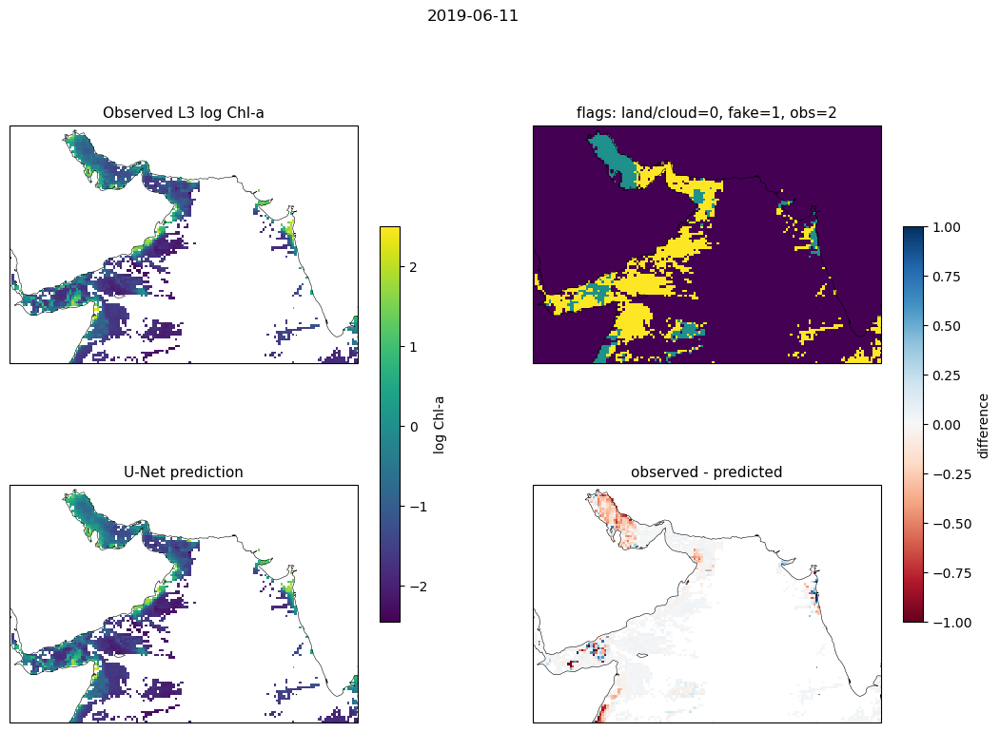

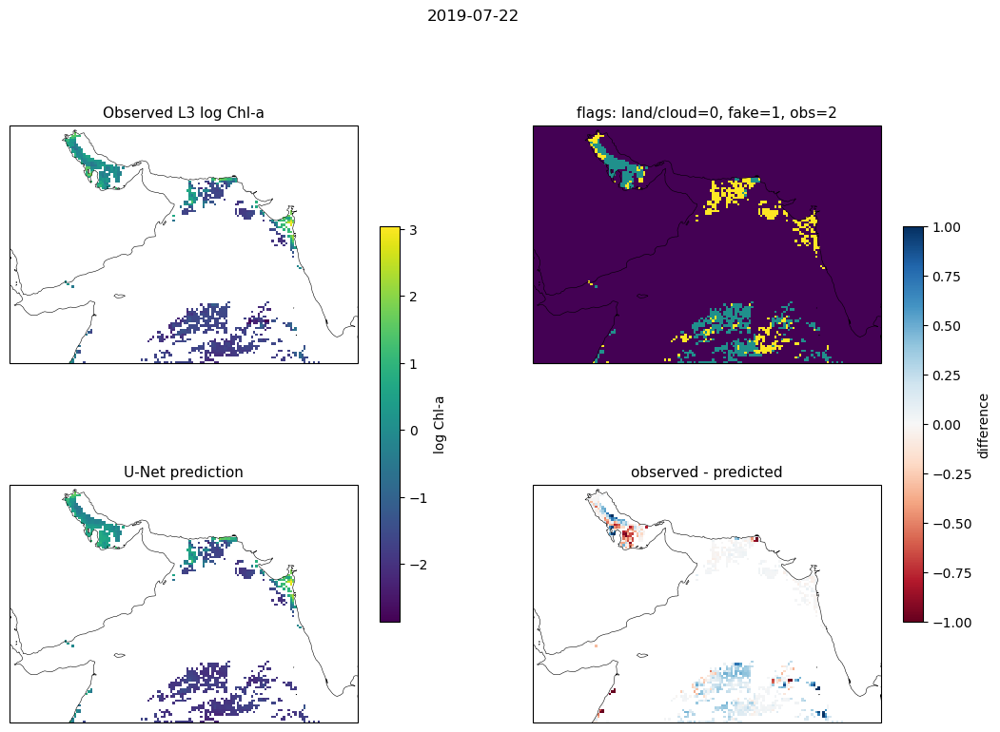

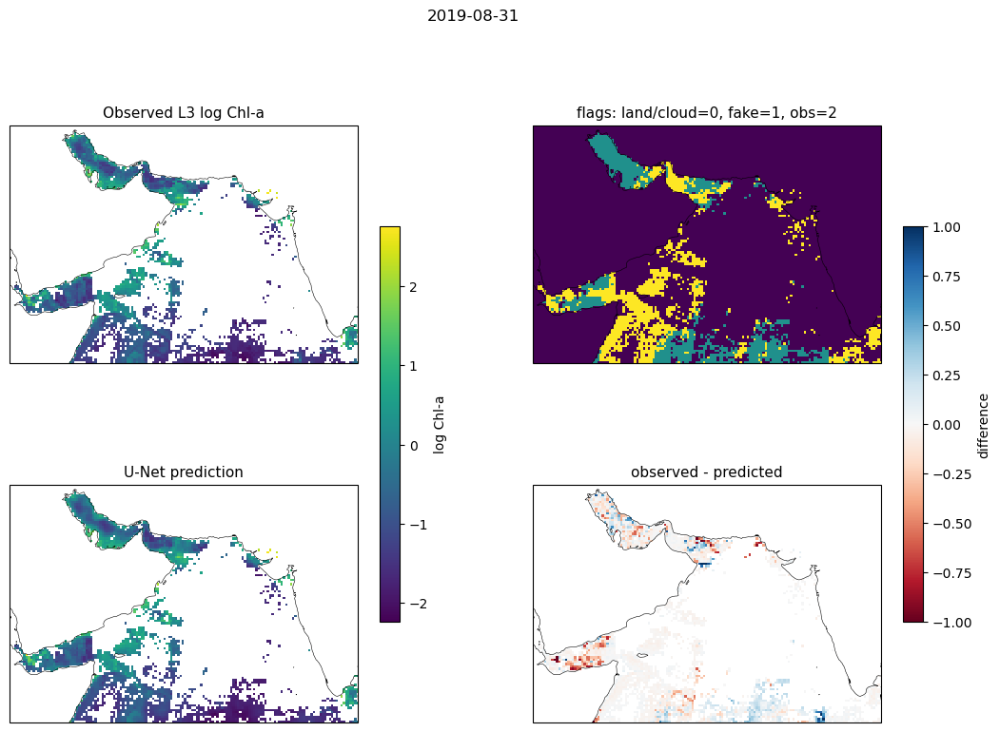

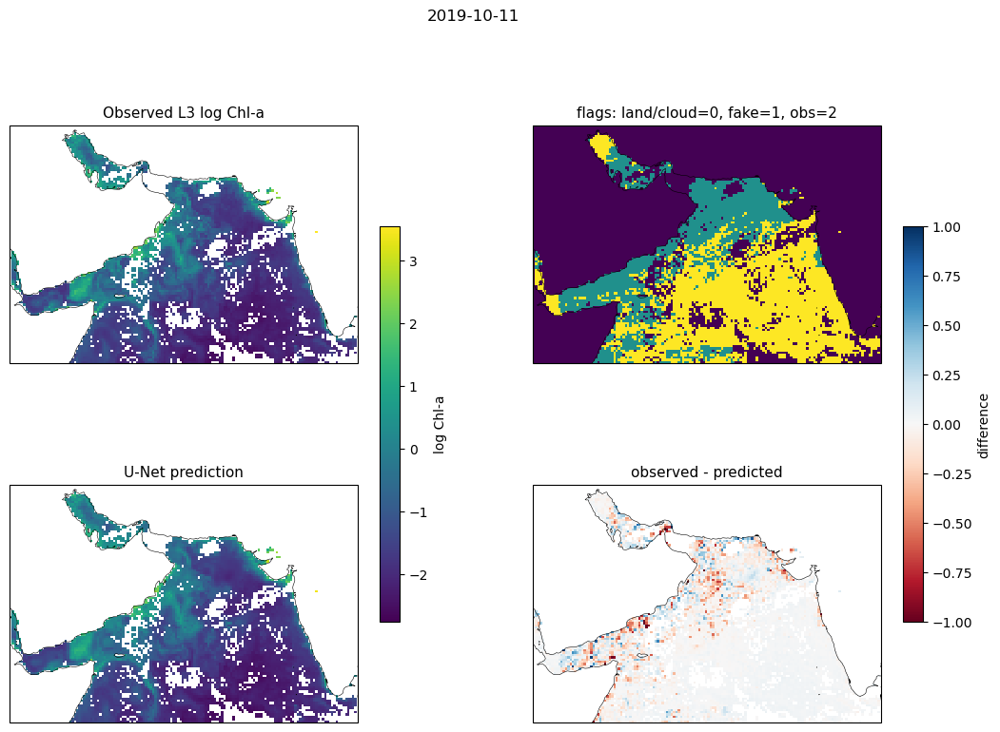

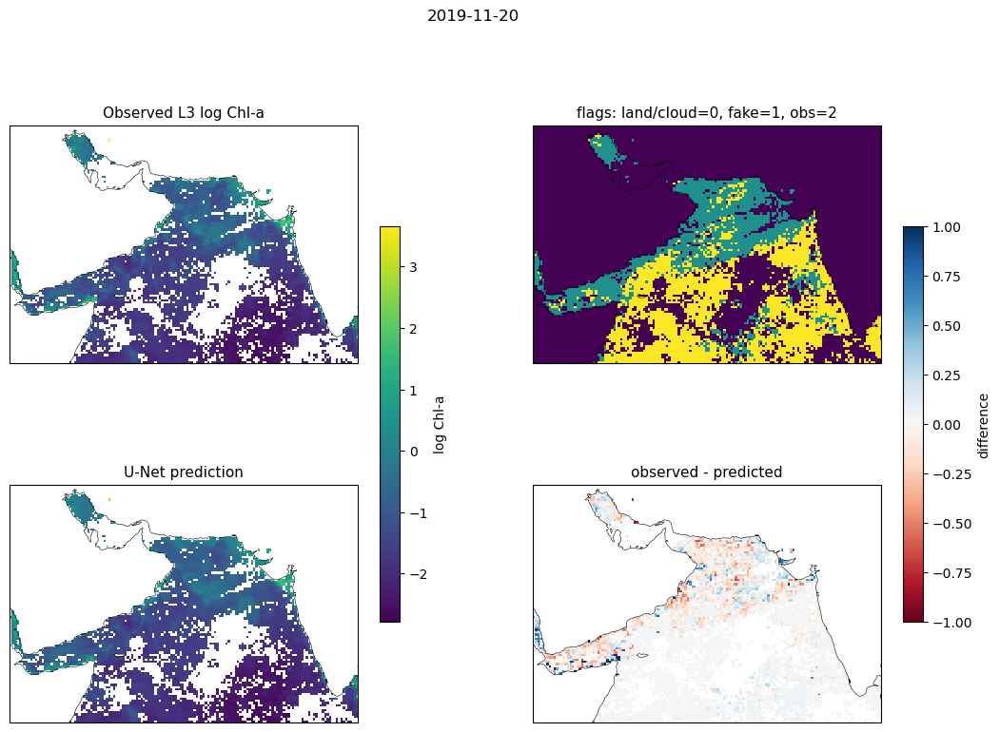

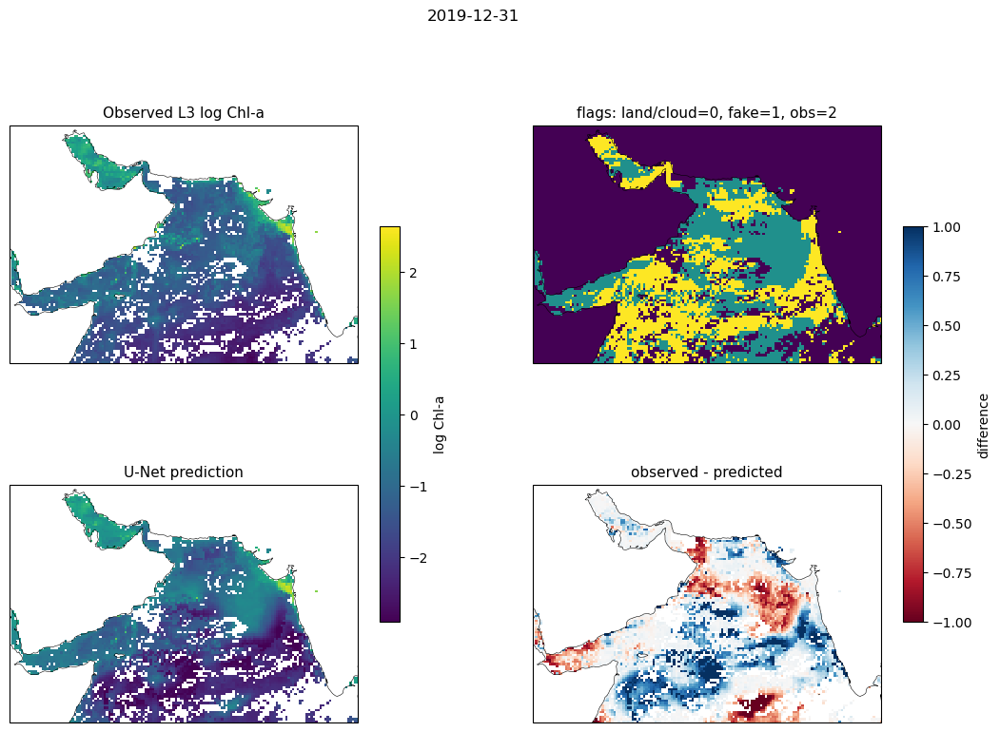

============================== nonoverlap ==============================


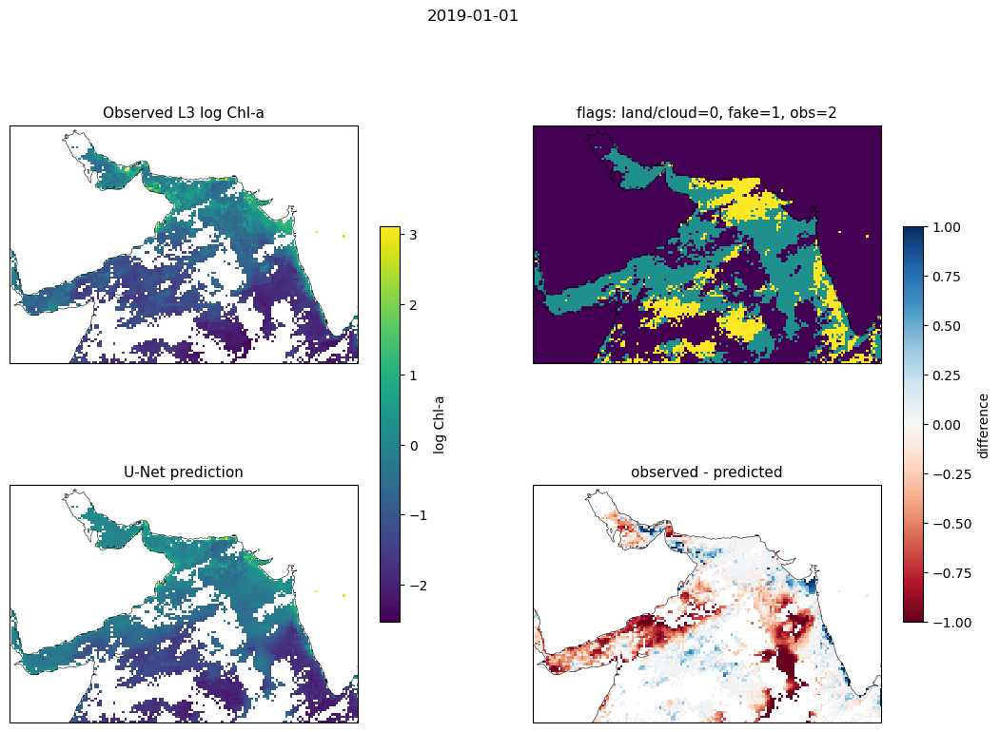

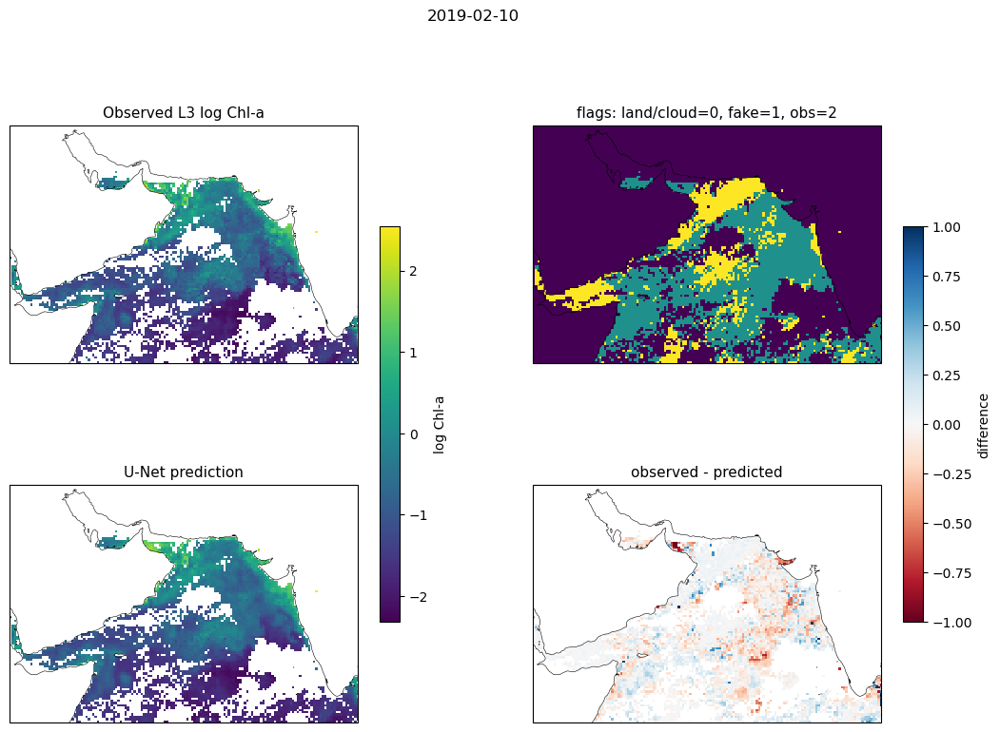

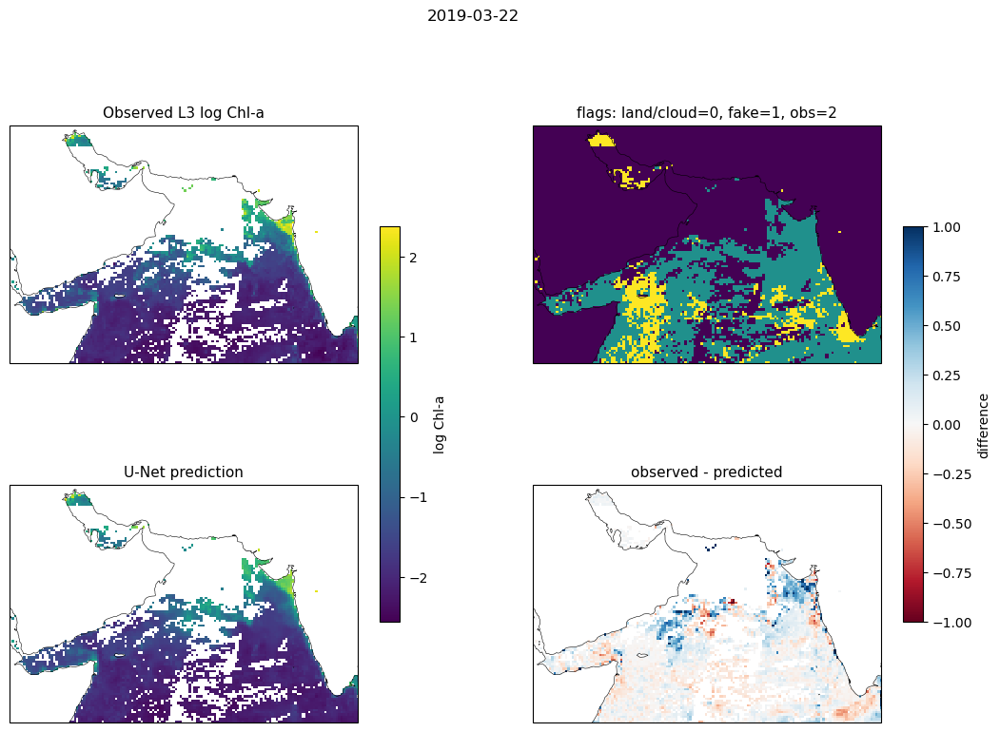

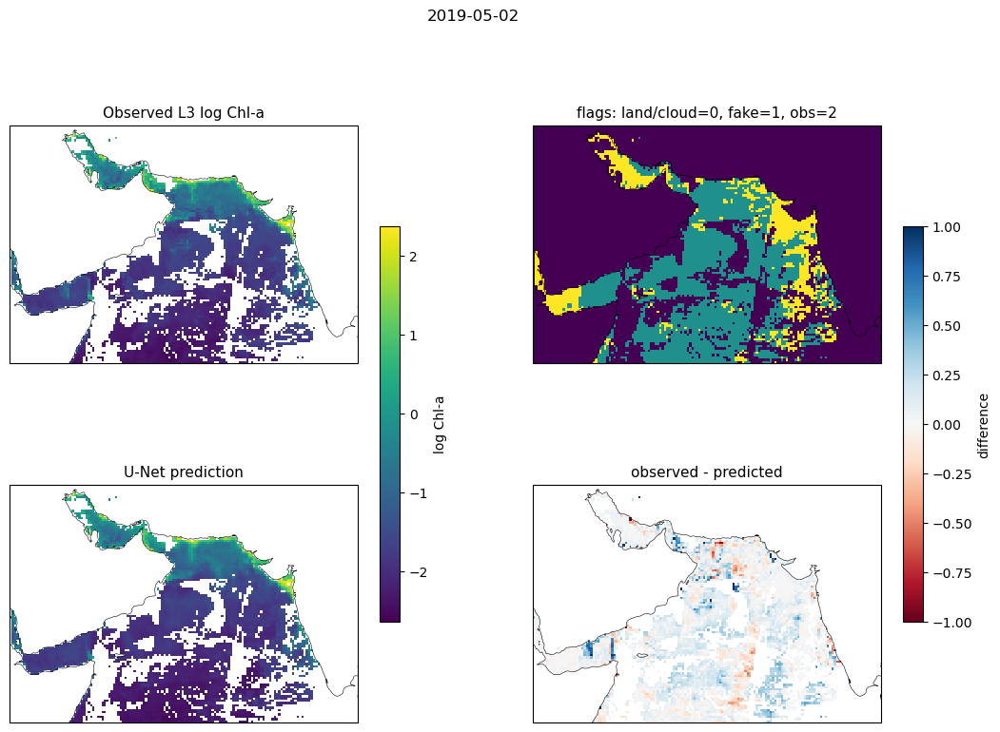

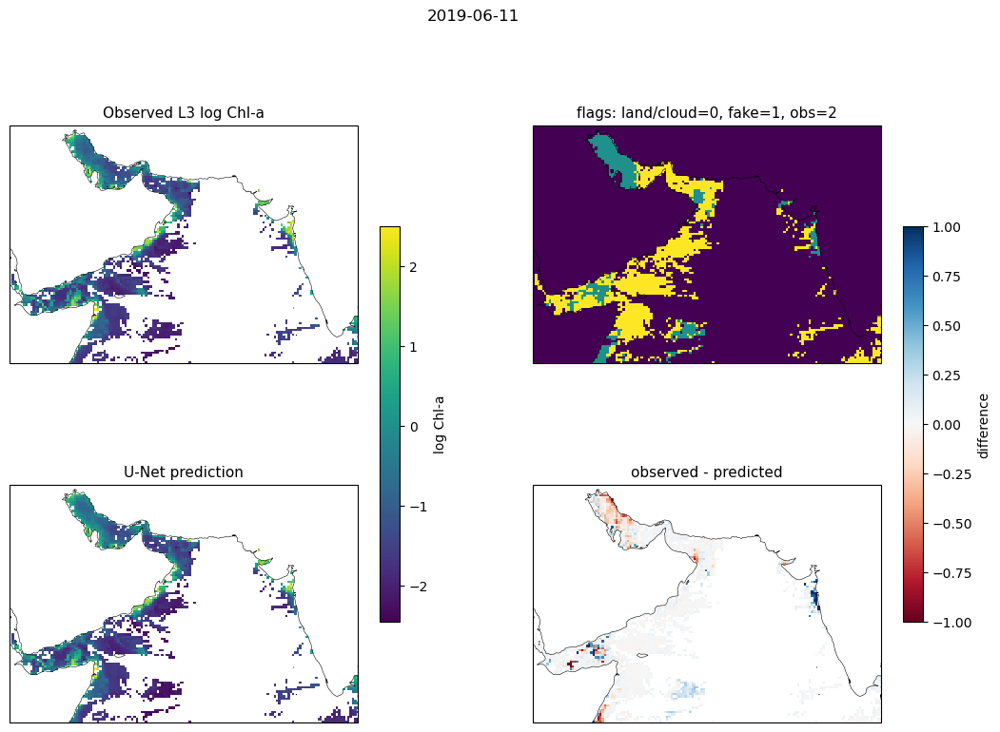

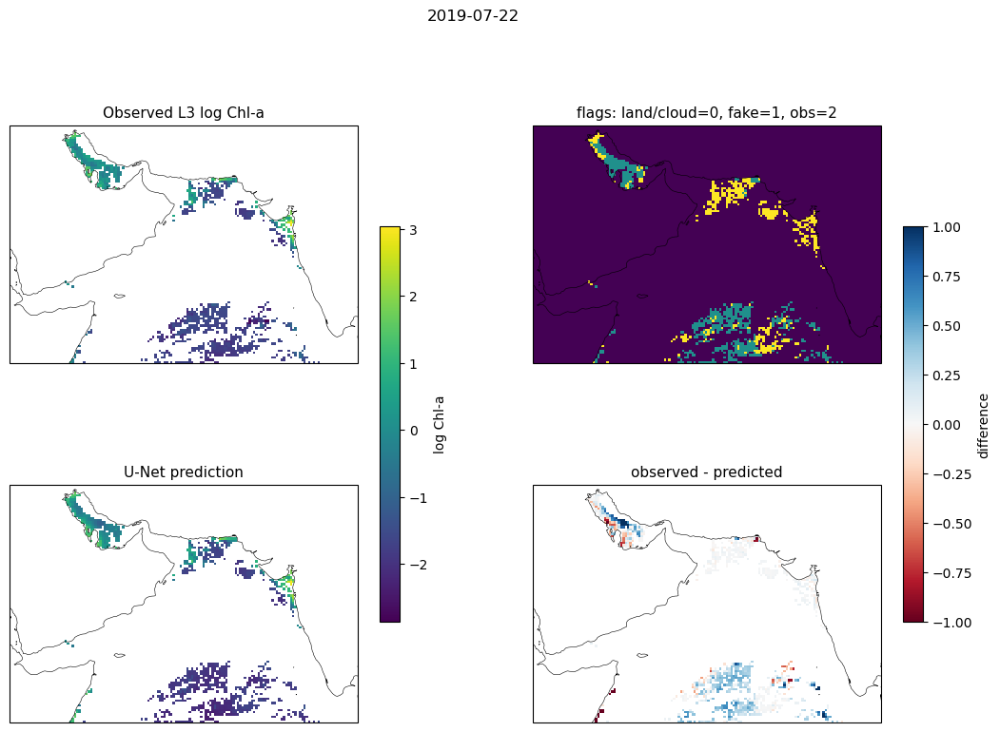

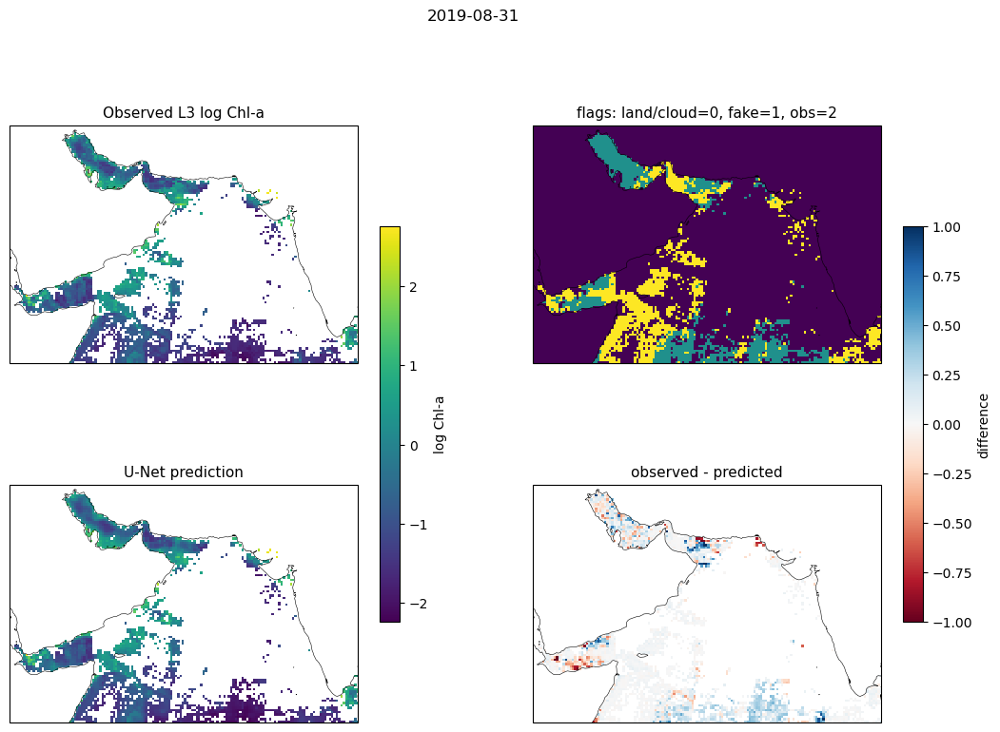

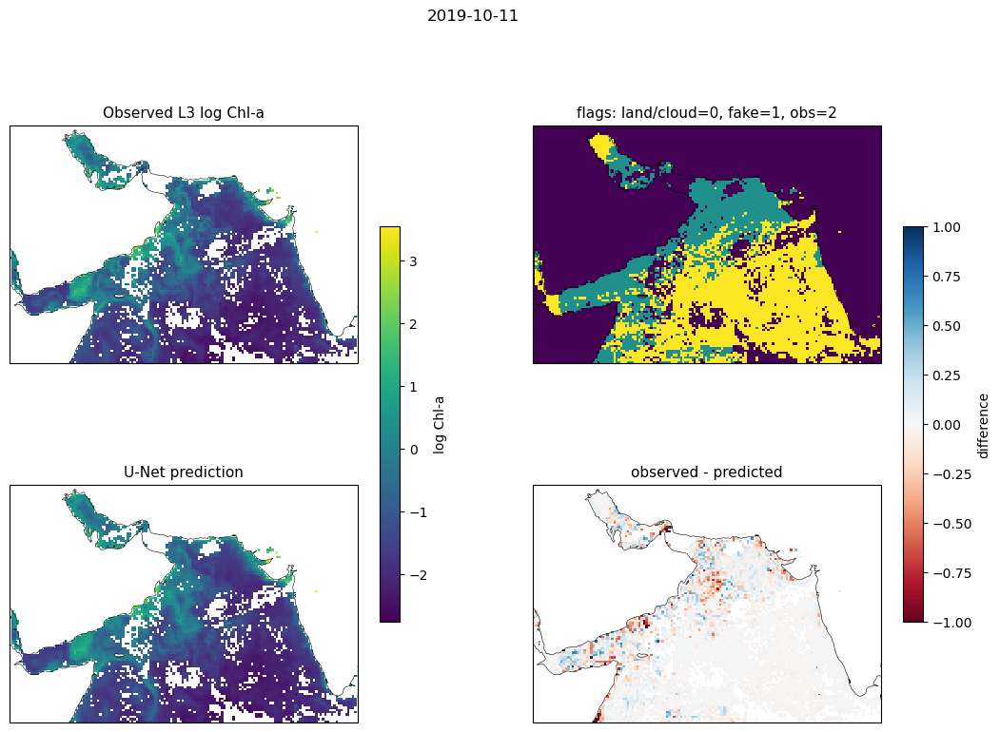

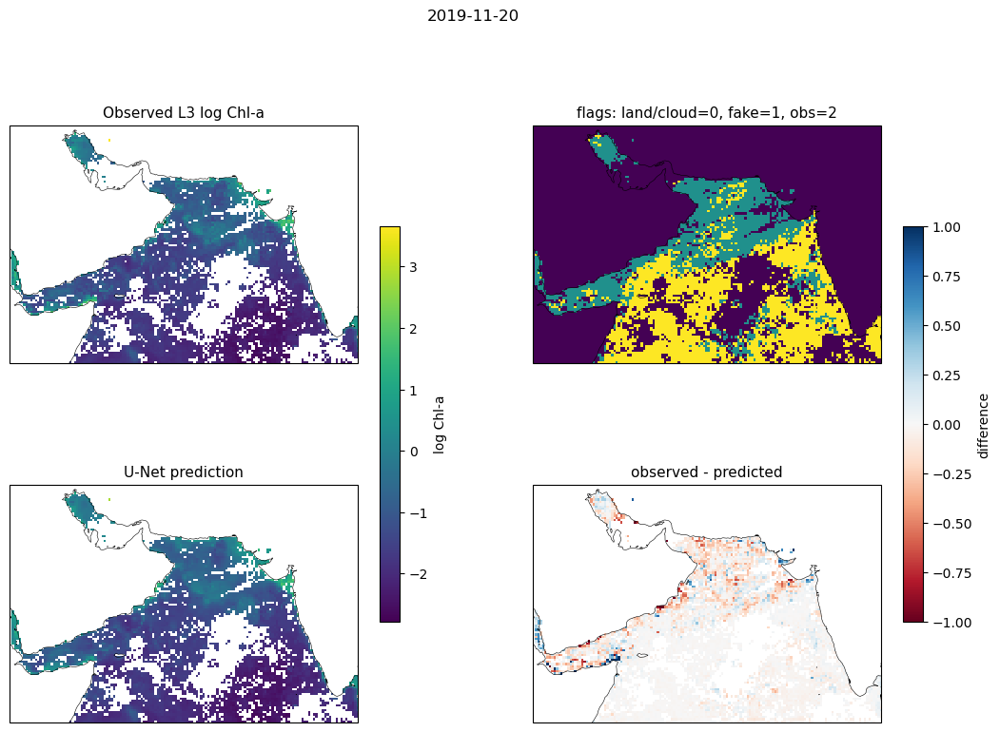

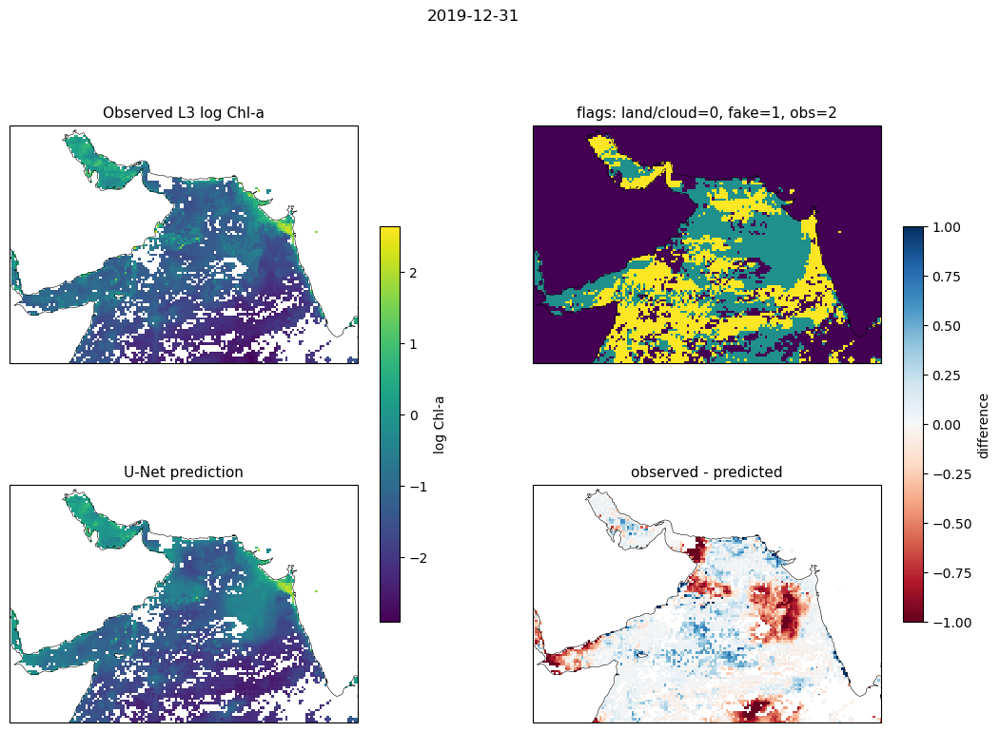

============================== overlap ==============================


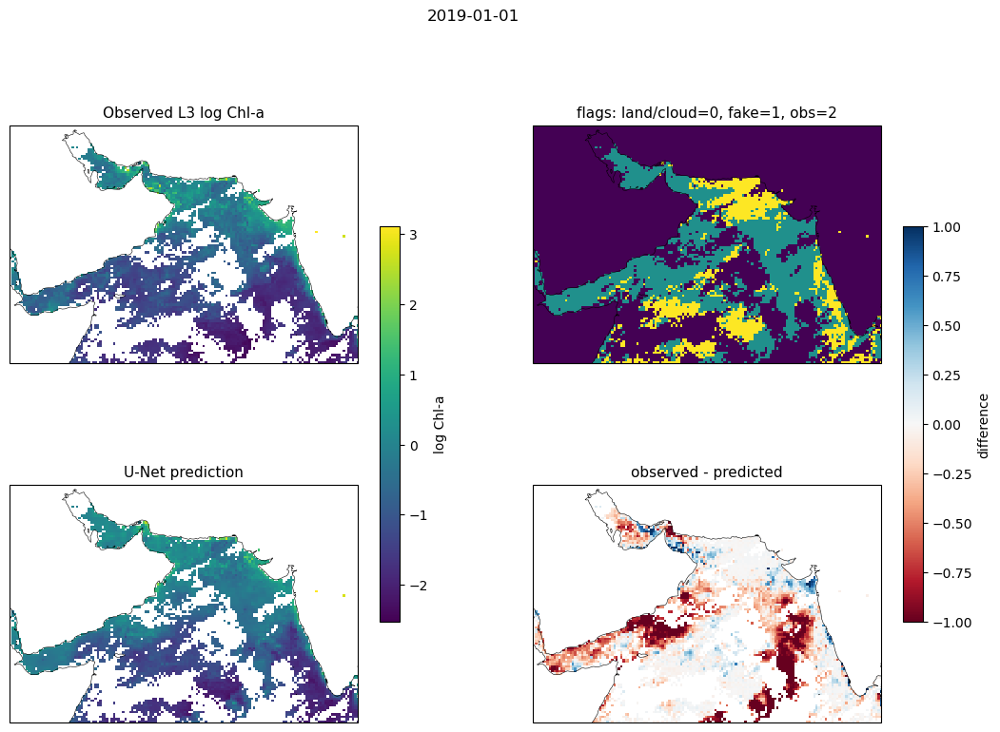

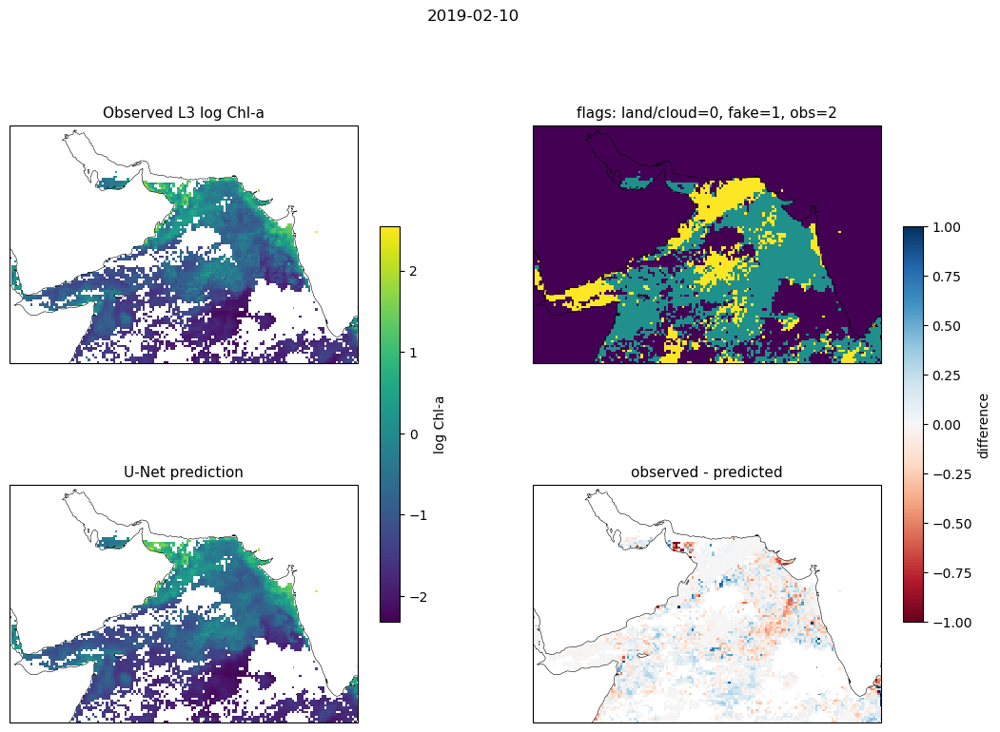

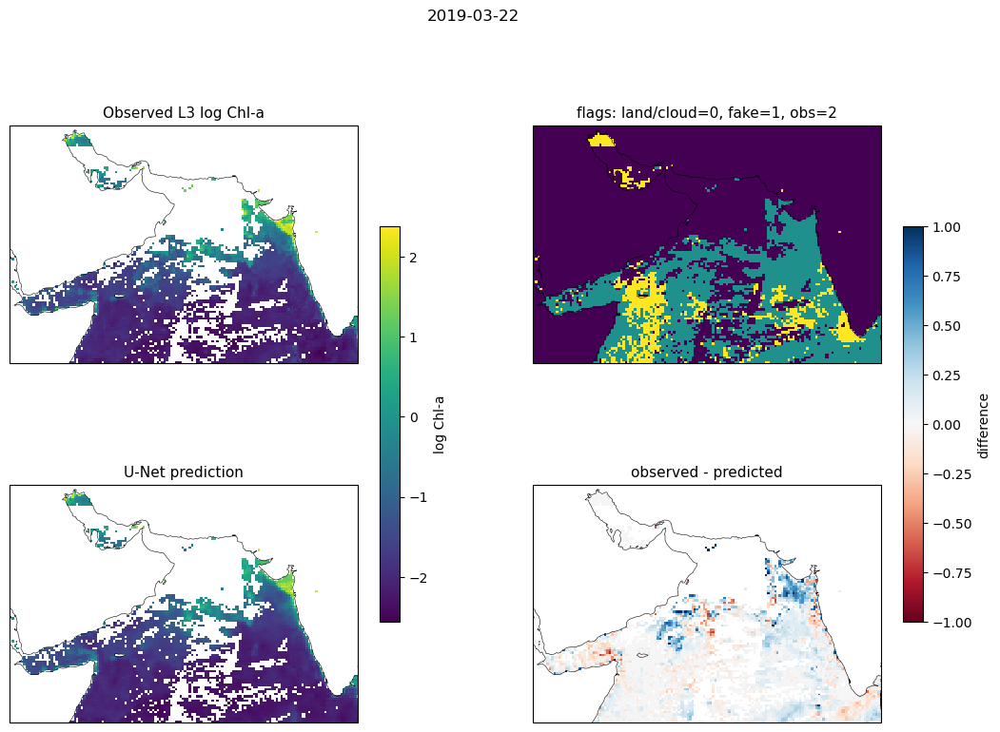

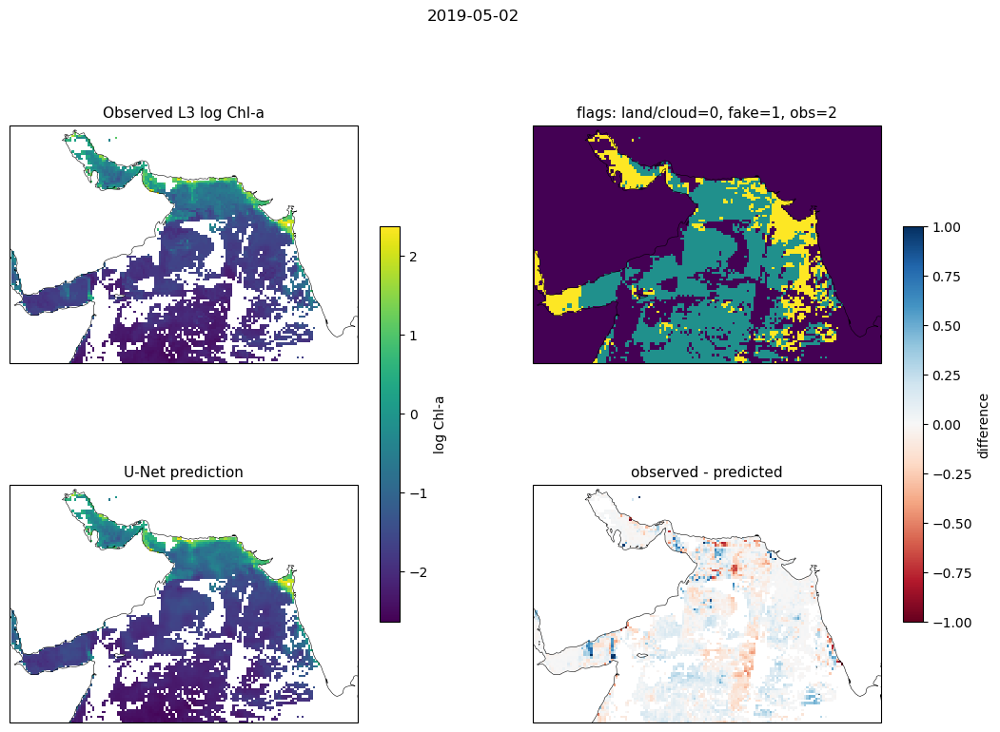

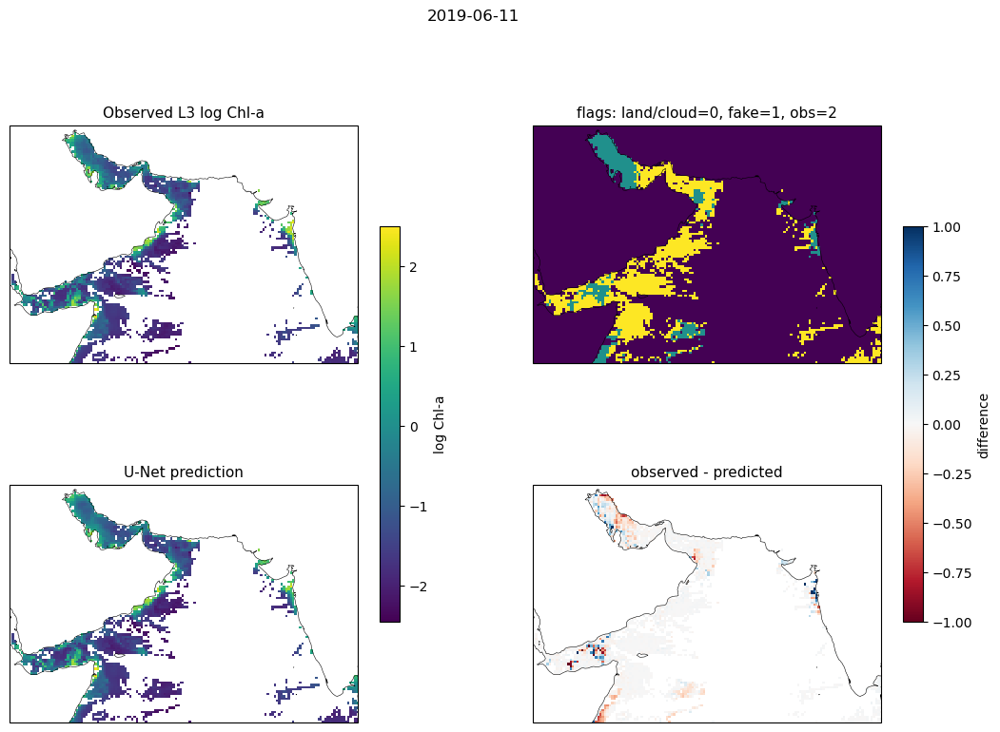

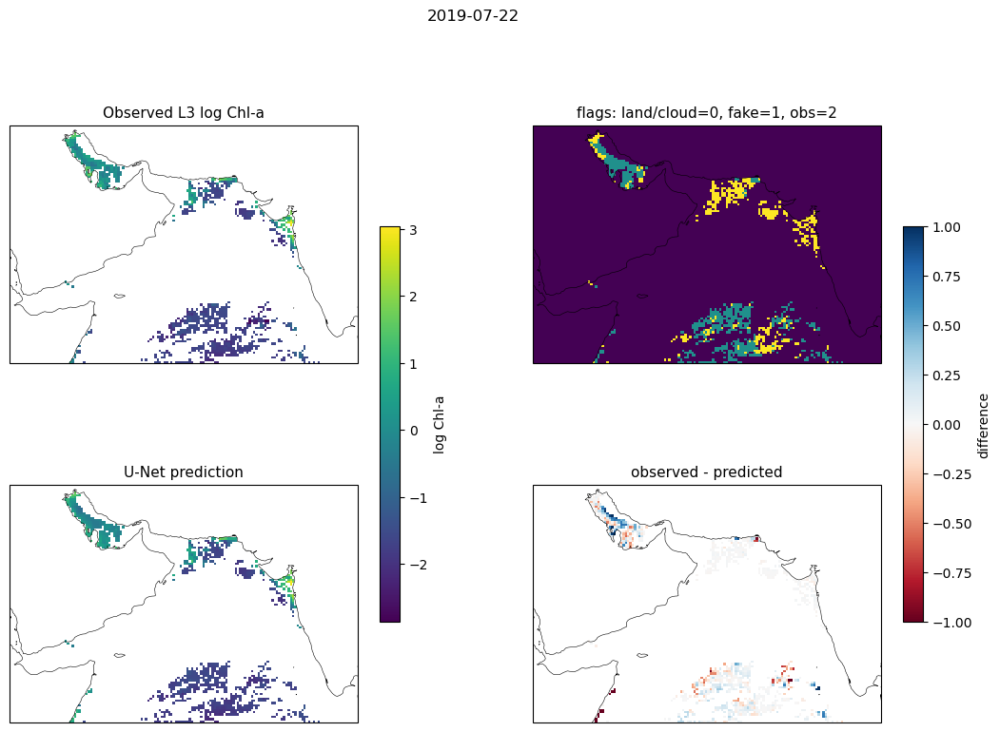

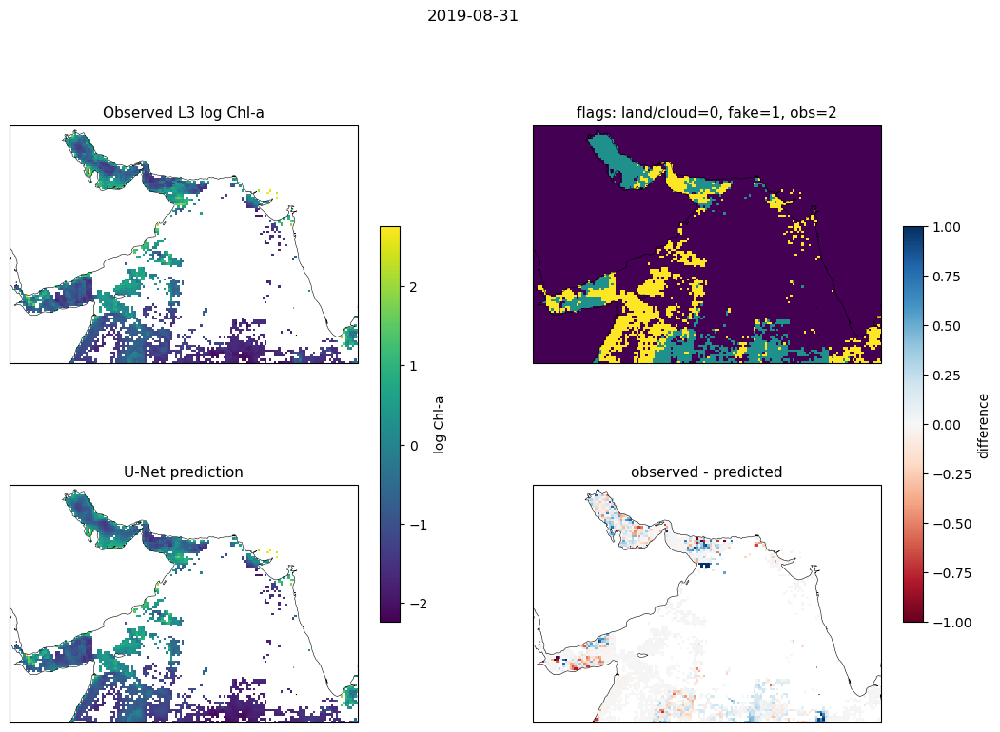

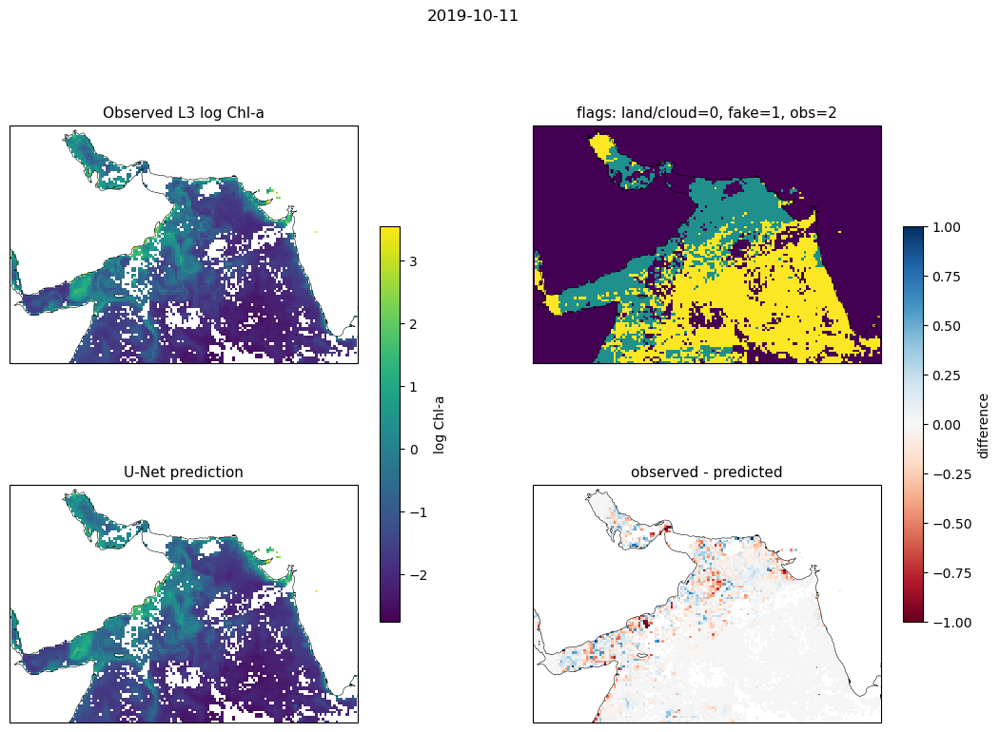

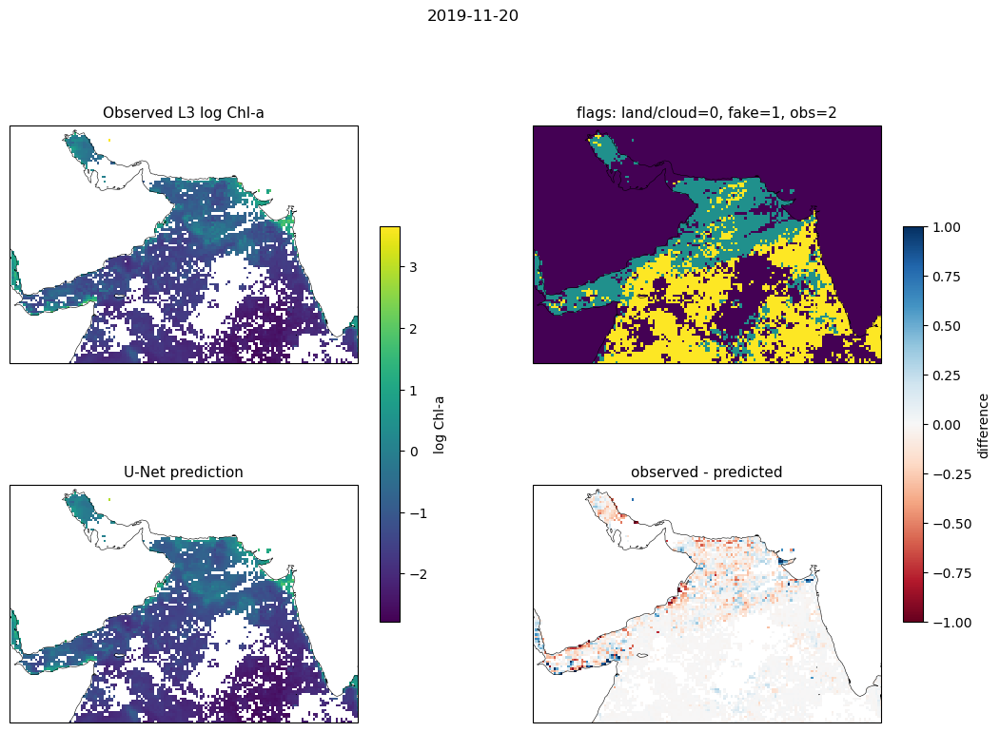

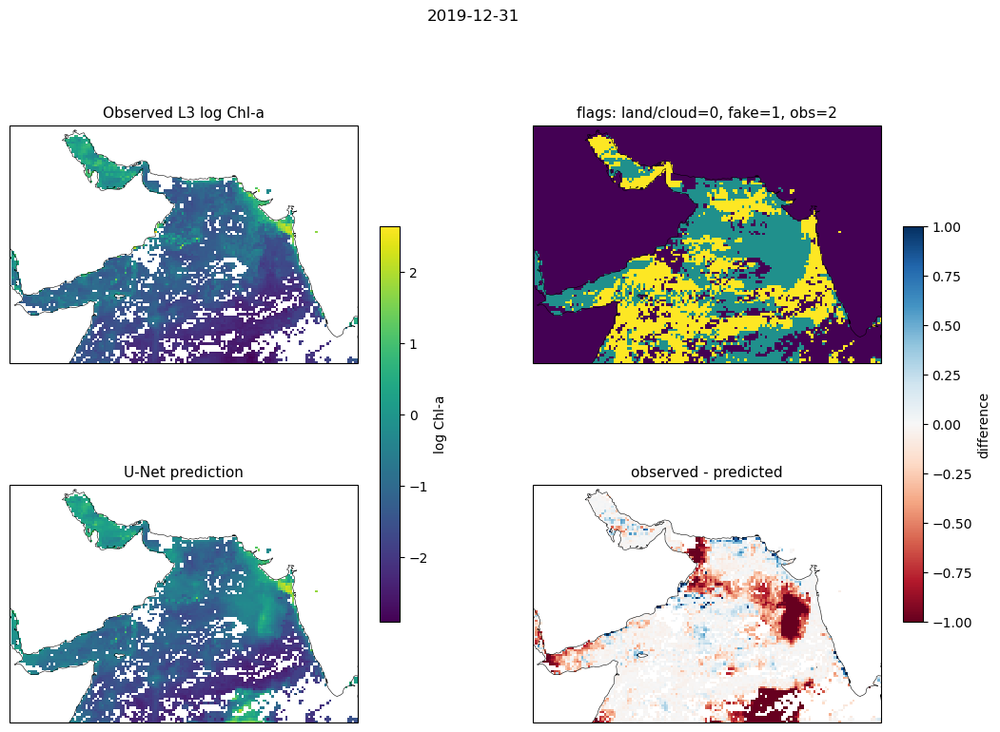

============================== overlap_small ==============================


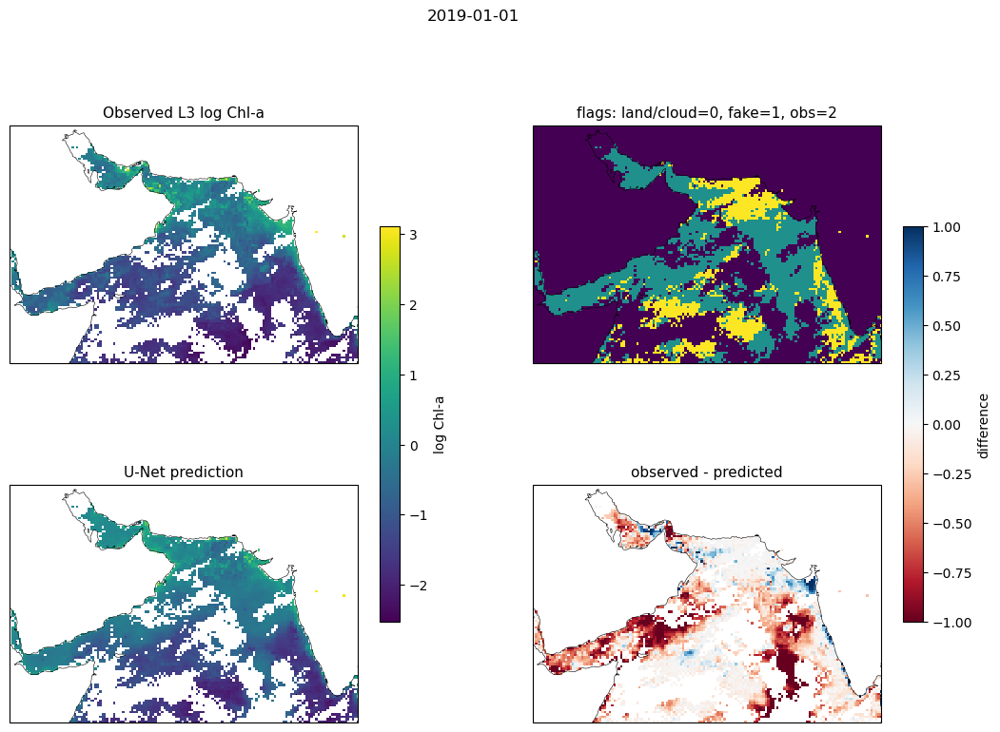

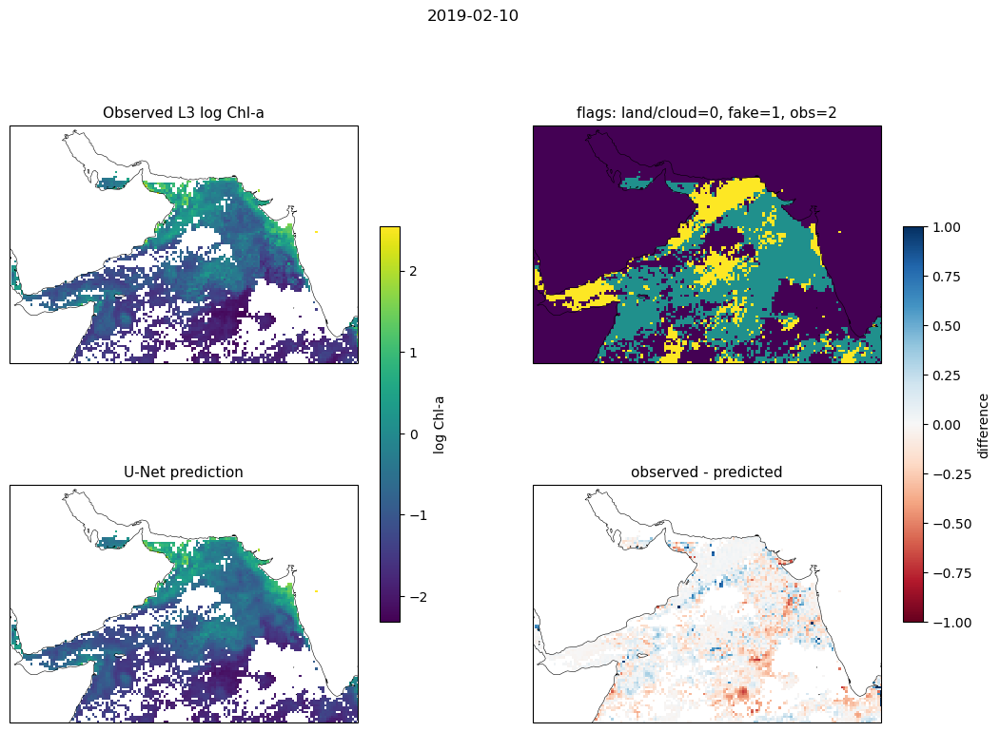

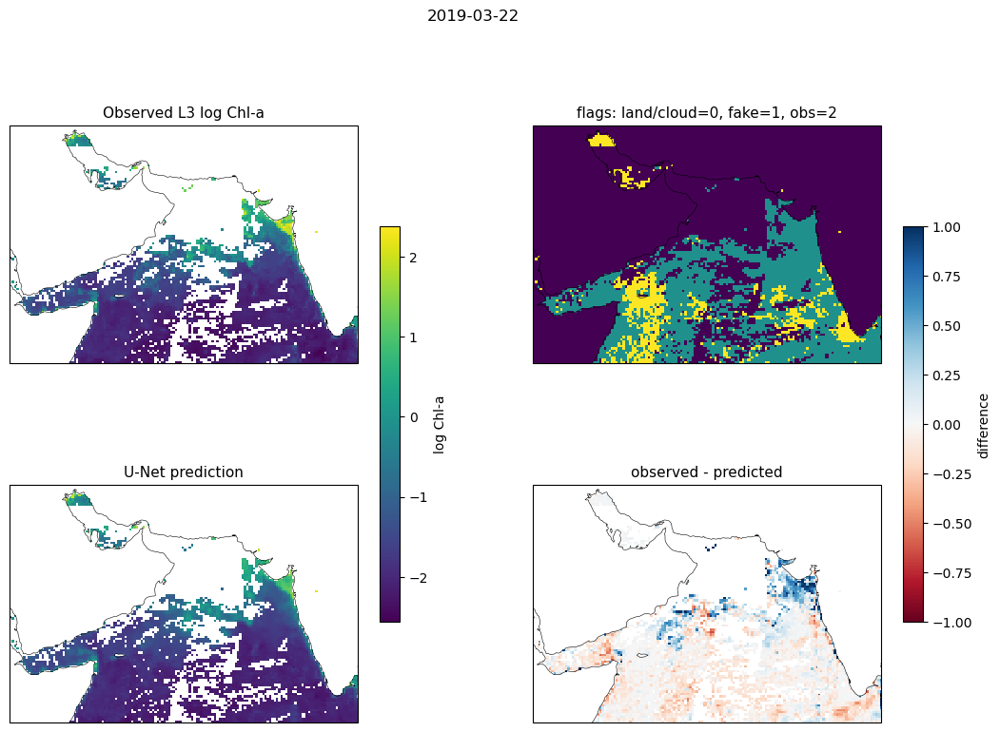

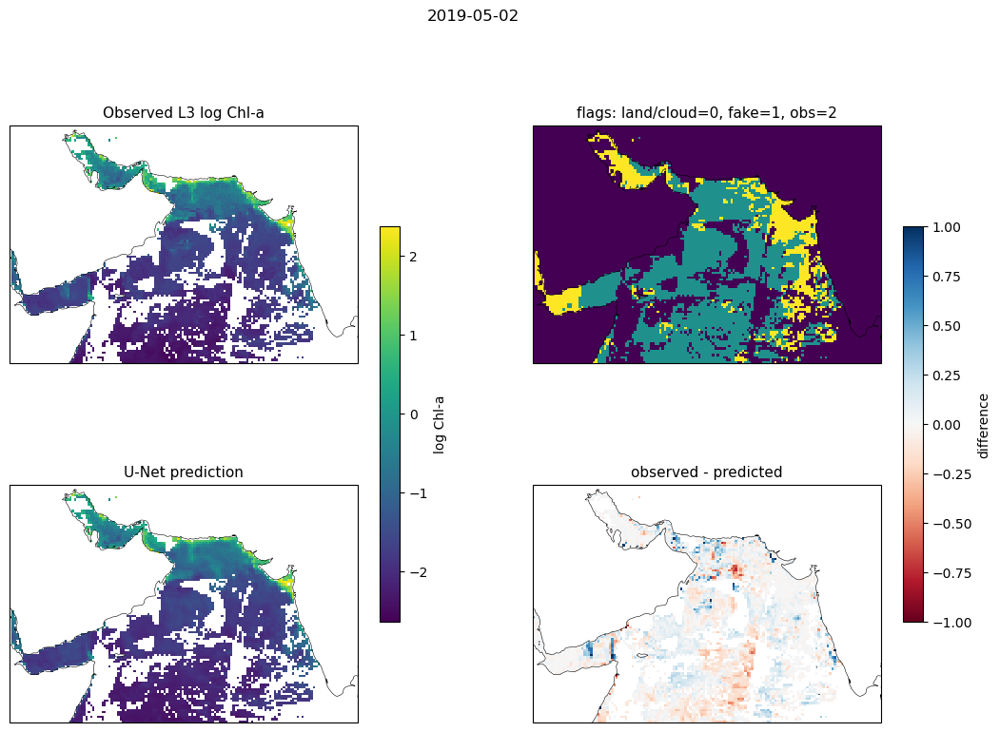

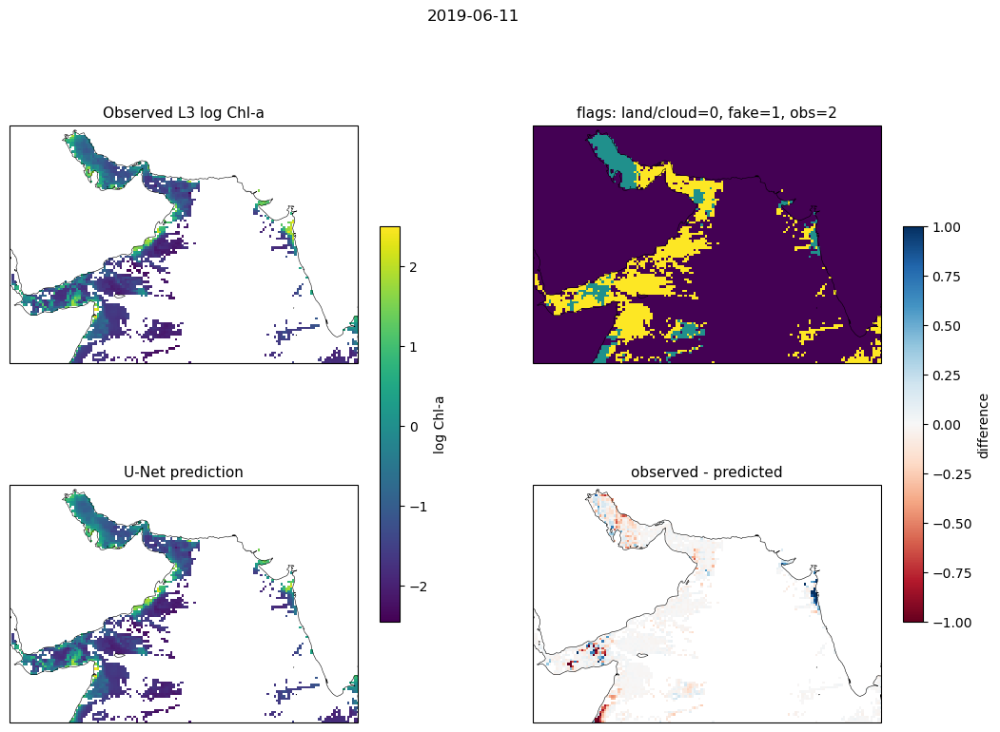

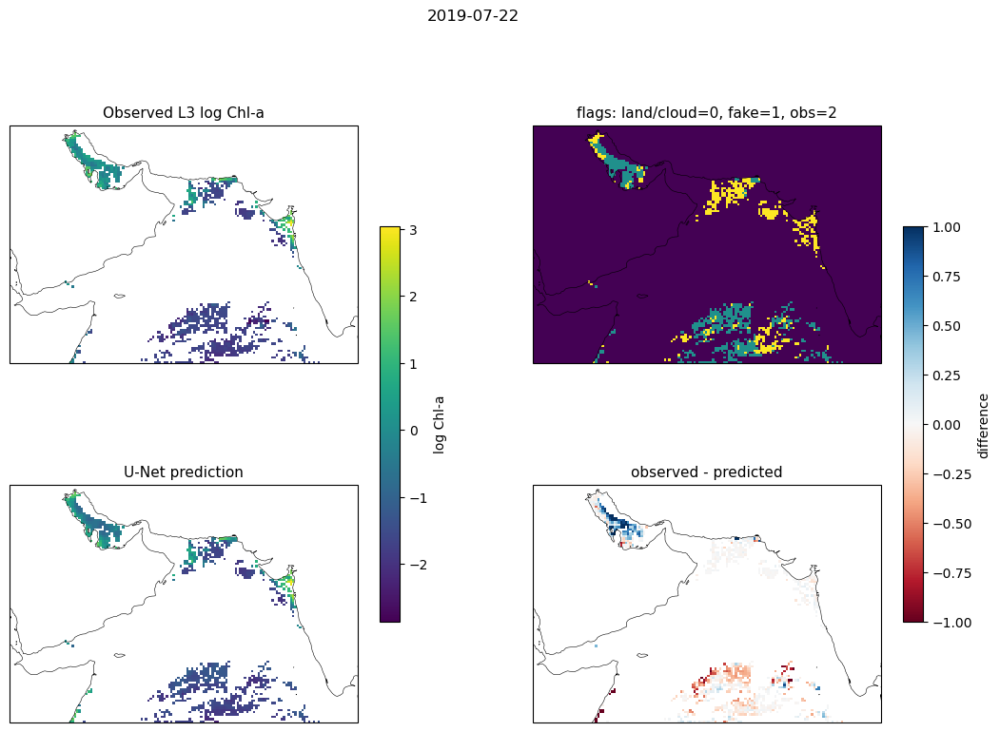

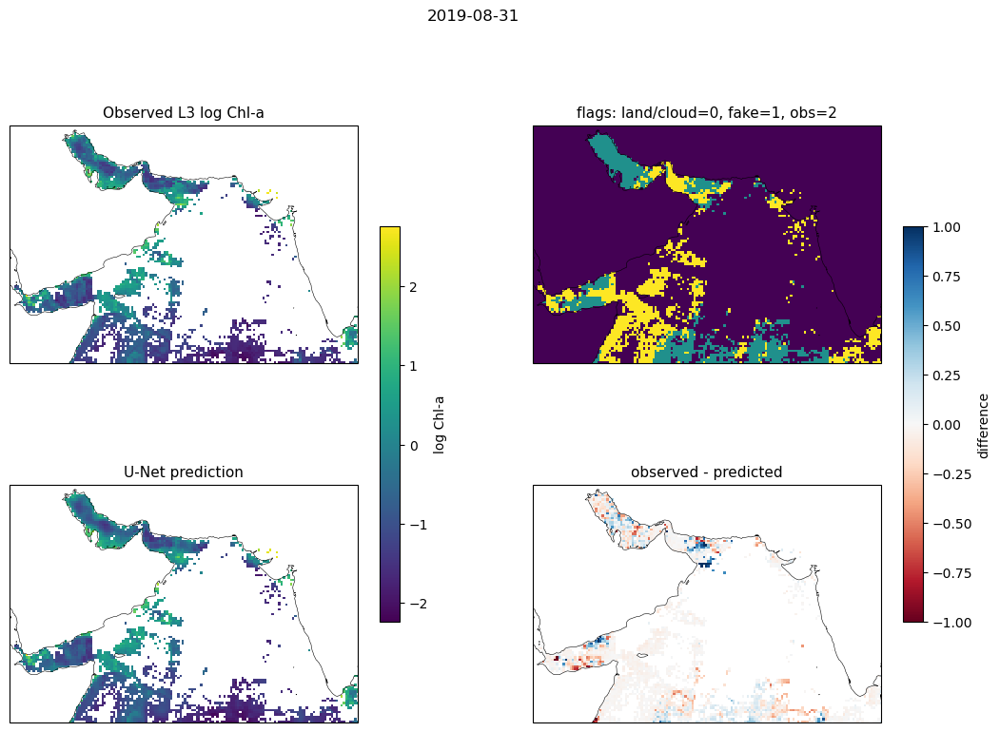

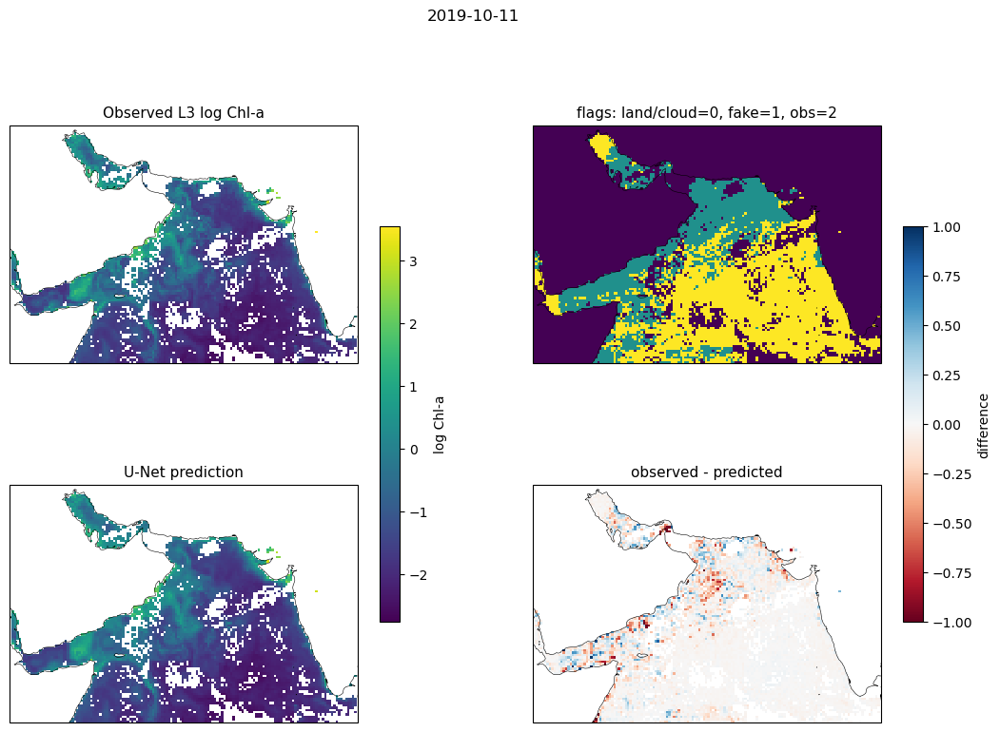

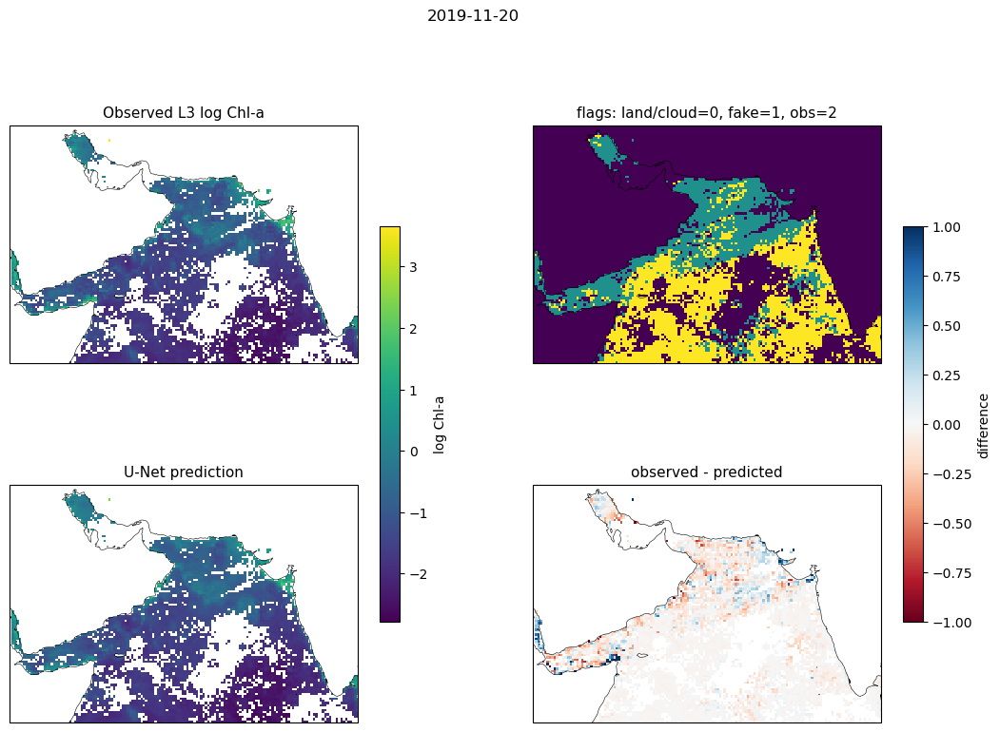

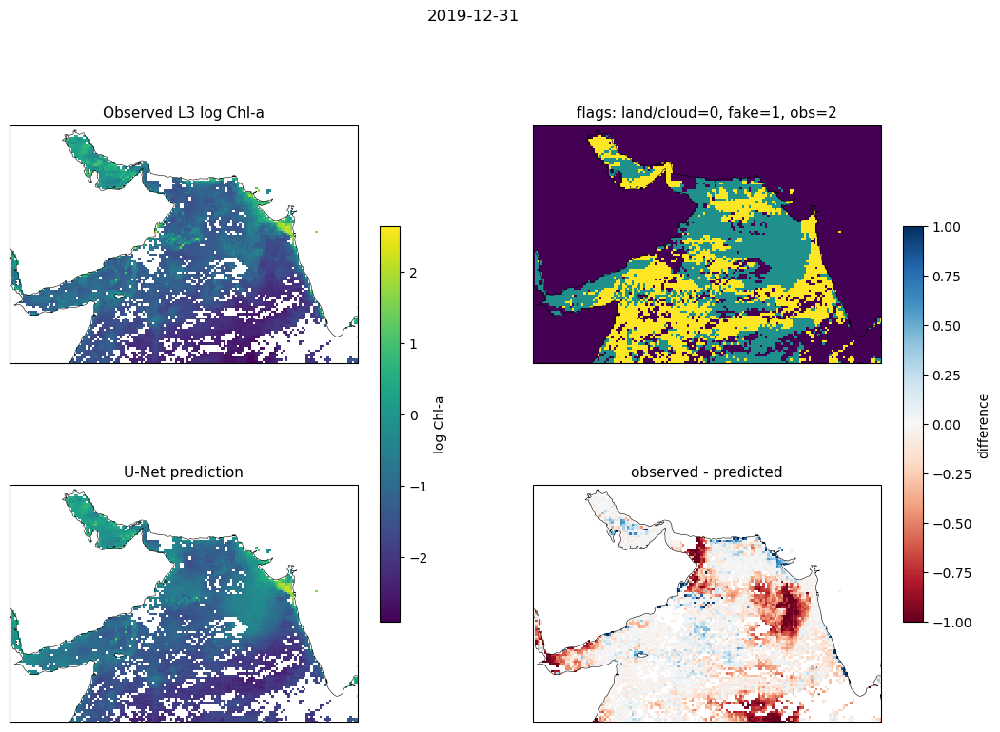

============================== random ==============================


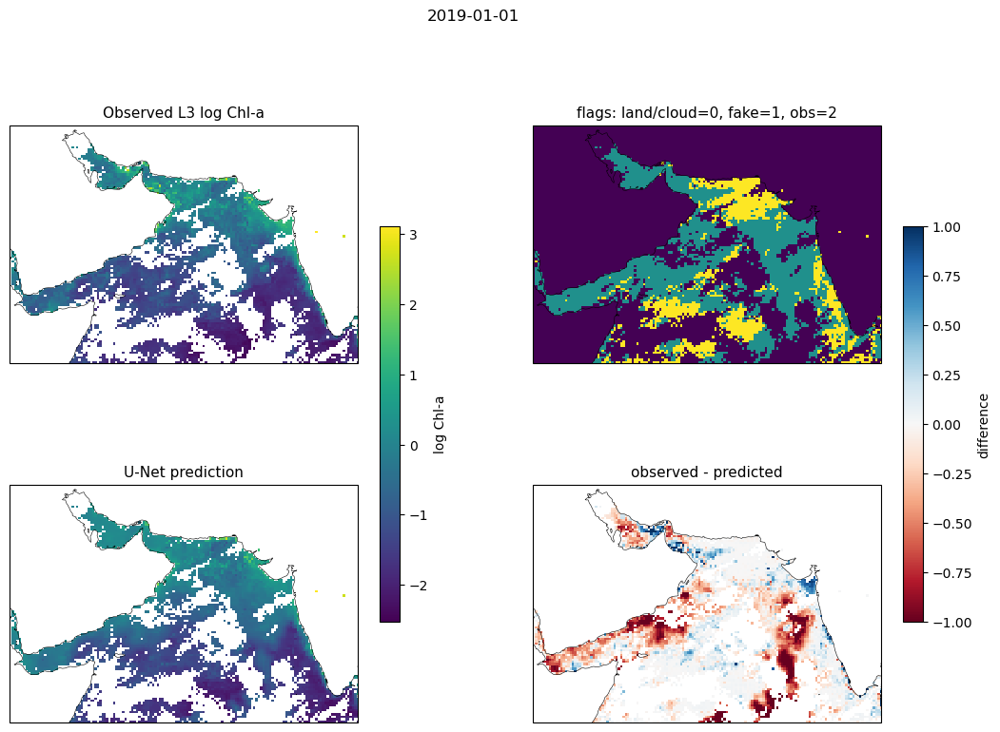

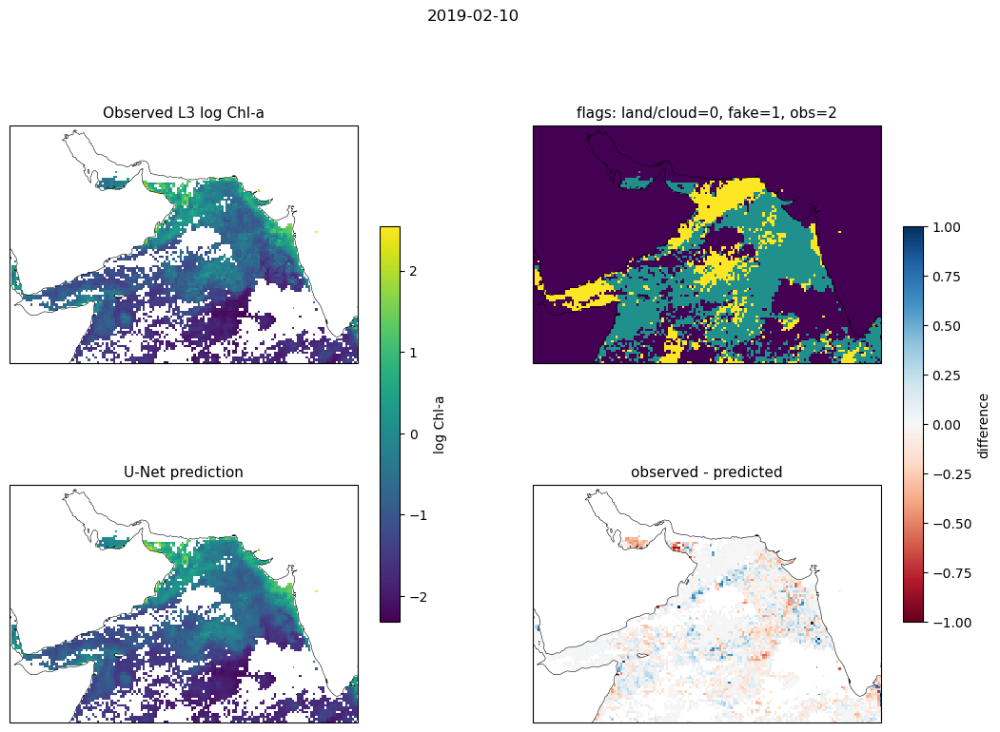

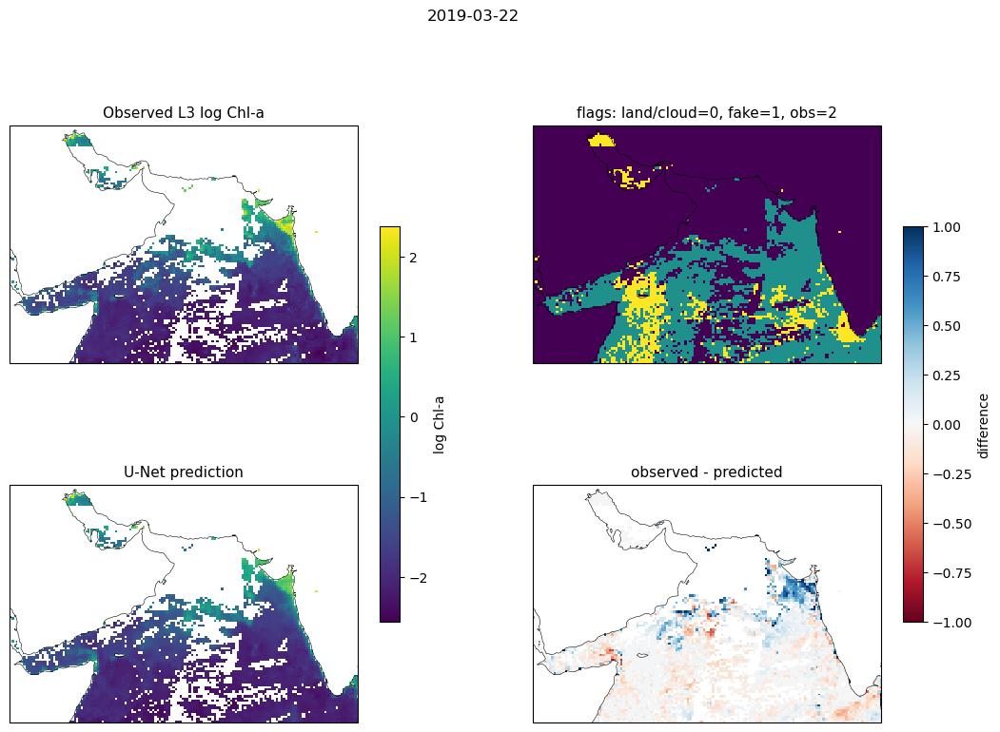

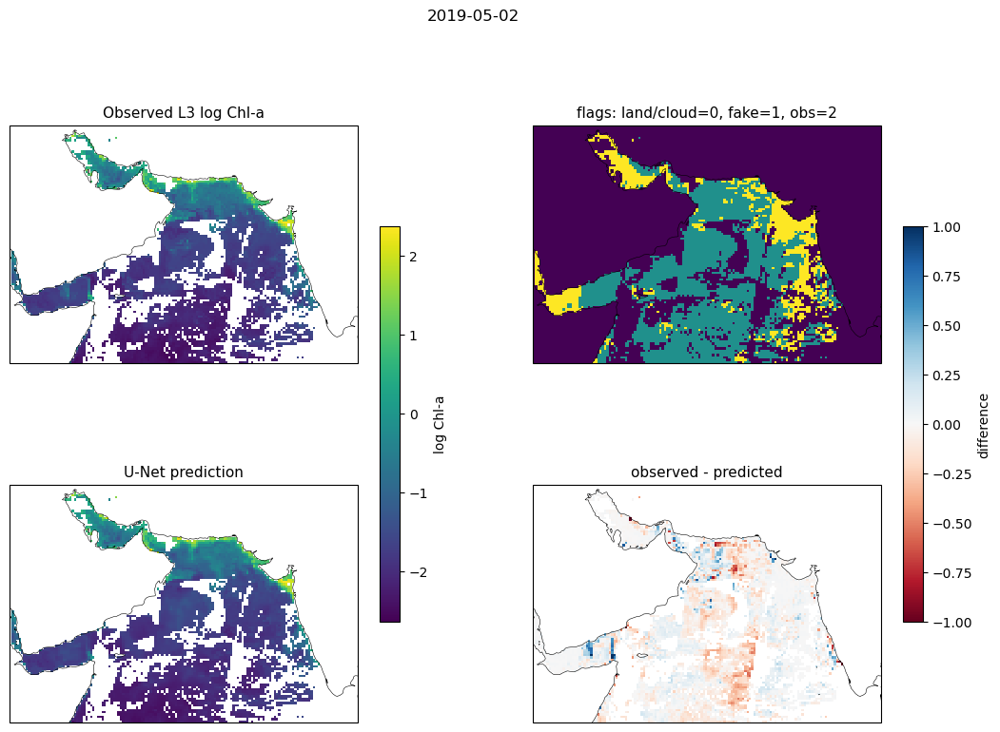

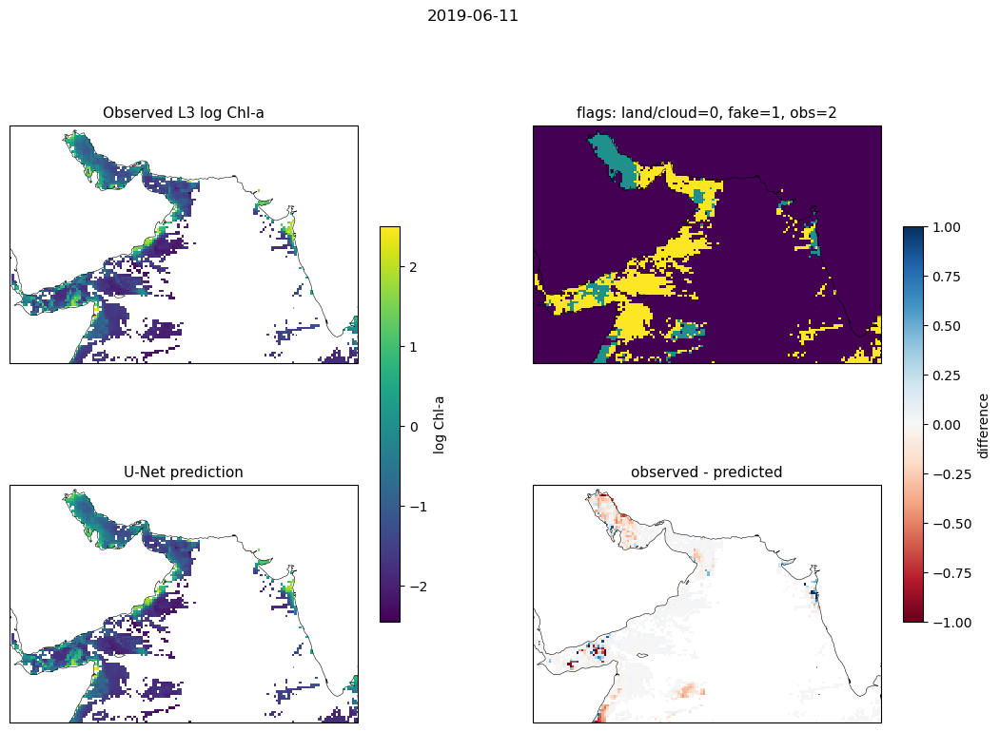

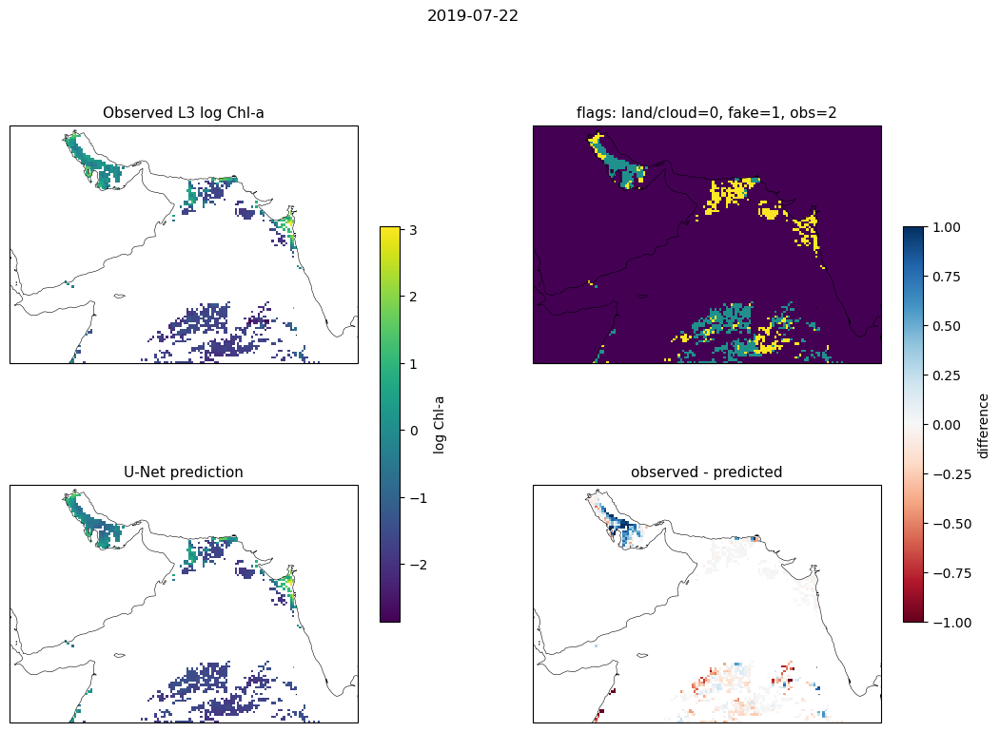

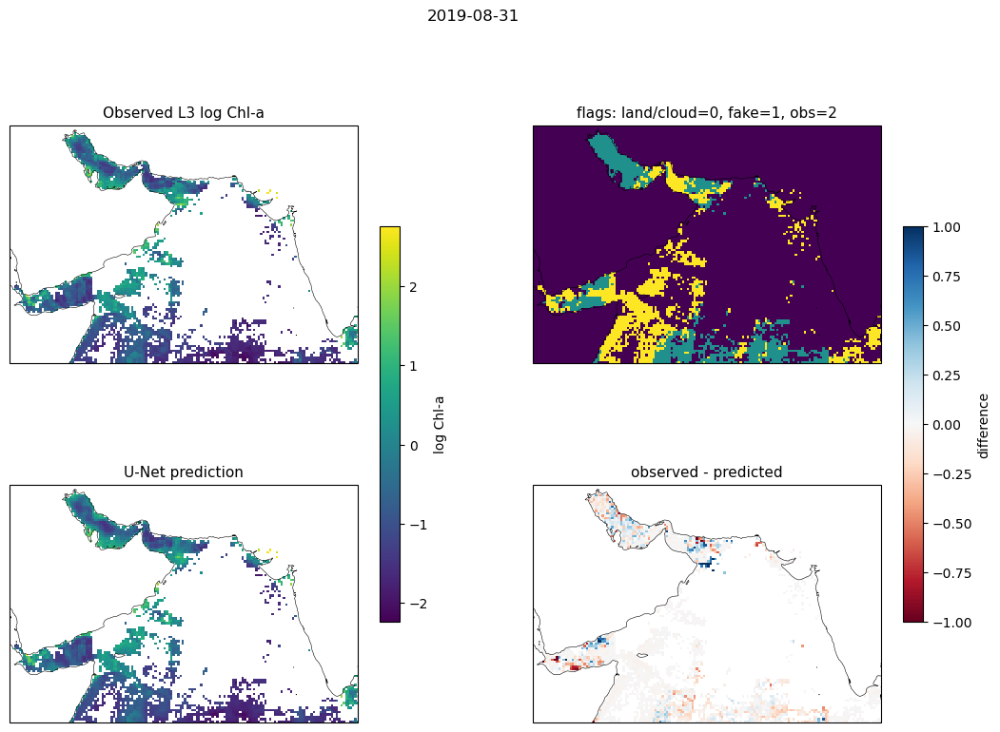

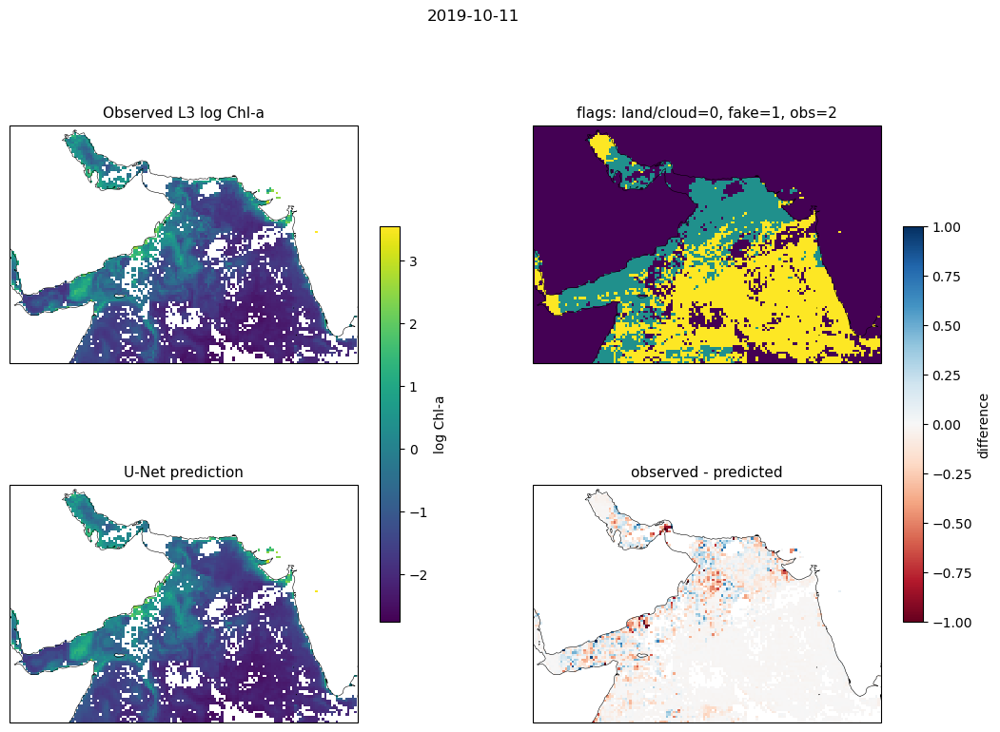

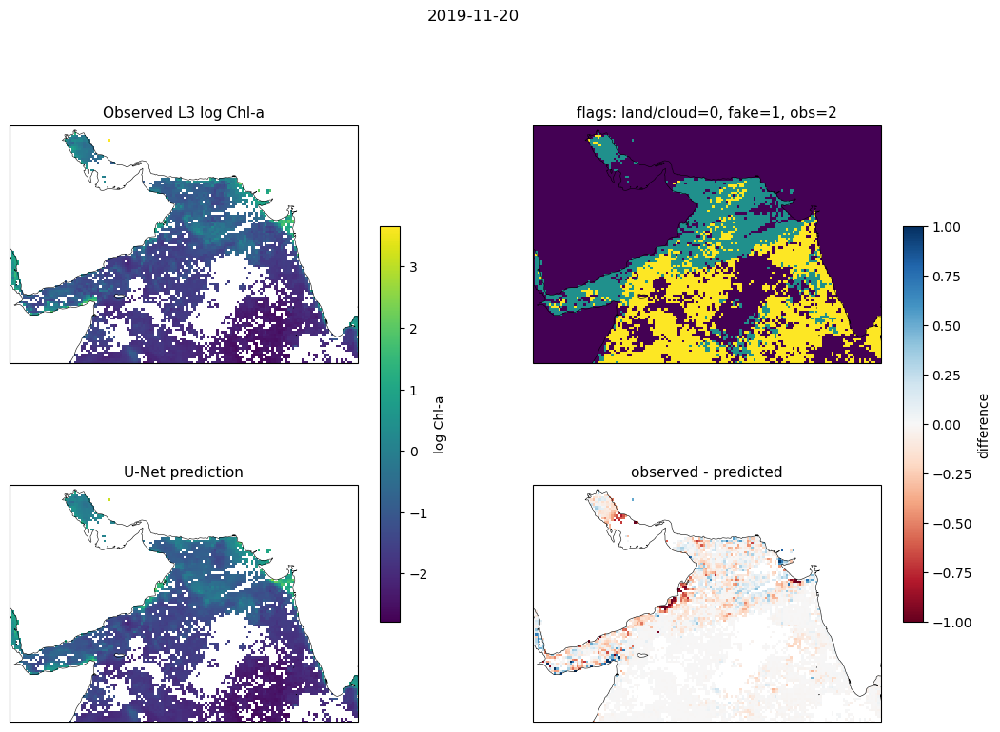

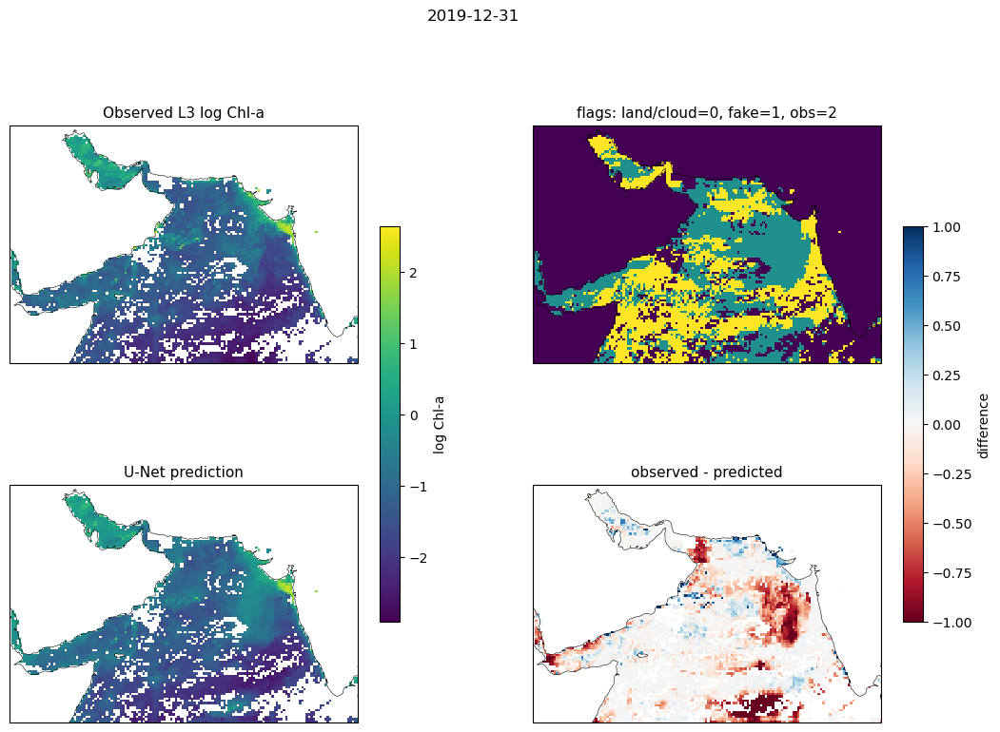

In [40]:
# 4-panel observed-vs-predicted (no Copernicus). Self-contained so it does not depend on the
# Hub's (older) mtg.viz signature. Compares the U-Net prediction to the observed Level-3 field;
# the flags panel marks the held-out fake-cloud pixels the model had to reconstruct.
def plot_observed(model, ds_std, date):
    xv = [v for v in ds_std.data_vars if v != "CHL"]
    sub = ds_std.sel(time=date)
    X = np.stack([np.nan_to_num(sub[v].values, nan=0.0) for v in xv], -1).astype(np.float32)
    pred = model.predict(X[np.newaxis, ...], verbose=0)[0, :, :, 0] * y_std + y_mean
    truth = sub["CHL"].values * y_std + y_mean
    pred = np.where(np.isnan(truth), np.nan, pred)   # only show where L3 was observed
    diff = truth - pred
    flag = np.where(~np.isnan(truth), 2.0, 0.0)
    flag = np.where(sub["fake_cloud_flag"].values == 1, 1.0, flag)

    extent = [float(ds_std.lon.min()), float(ds_std.lon.max()),
              float(ds_std.lat.min()), float(ds_std.lat.max())]
    vmin, vmax = np.nanmin(truth), np.nanmax(truth)
    fig, ax = plt.subplots(2, 2, figsize=(13, 9), subplot_kw={"projection": ccrs.PlateCarree()})

    def show(a, arr, ttl, **kw):
        im = a.imshow(arr, extent=extent, origin="upper", transform=ccrs.PlateCarree(),
                      interpolation="nearest", **kw)
        a.add_feature(cfeature.COASTLINE, linewidth=0.4)
        a.set_title(ttl, size=11)
        return im

    im0 = show(ax[0, 0], truth, "Observed L3 log Chl-a", vmin=vmin, vmax=vmax)
    show(ax[0, 1], flag, "flags: land/cloud=0, fake=1, obs=2", vmin=0, vmax=2)
    show(ax[1, 0], pred, "U-Net prediction", vmin=vmin, vmax=vmax)
    im3 = show(ax[1, 1], diff, "observed - predicted", vmin=-1, vmax=1, cmap=plt.cm.RdBu)
    fig.colorbar(im0, ax=ax[:, 0], shrink=0.6, label="log Chl-a")
    fig.colorbar(im3, ax=ax[:, 1], shrink=0.6, label="difference")
    fig.suptitle(str(pd.to_datetime(date).date()), size=12)
    plt.show()

for name, p in STRAT_PATHS.items():
    if not os.path.exists(p):
        continue
    print("=" * 30, name, "=" * 30)
    model = tf.keras.models.load_model(p, compile=False)
    for d in DATES:
        plot_observed(model, ds_std_test, d)

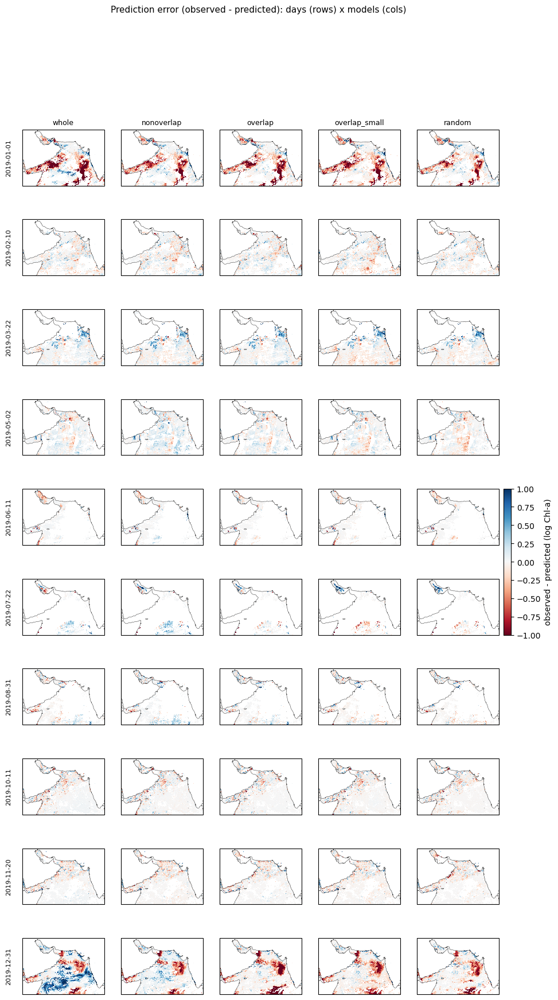

In [10]:
# Error grid: columns = models, rows = days. Each cell is (observed - predicted), the RdBu diff map.
_xv = [v for v in ds_std_test.data_vars if v != "CHL"]
_ext = [float(ds_std_test.lon.min()), float(ds_std_test.lon.max()),
        float(ds_std_test.lat.min()), float(ds_std_test.lat.max())]
models = [n for n in STRAT_PATHS if os.path.exists(STRAT_PATHS[n])]

diff_by = {}
for name in models:
    mdl = tf.keras.models.load_model(STRAT_PATHS[name])
    for d in DATES:
        sub = ds_std_test.sel(time=d)
        X = np.stack([np.nan_to_num(sub[v].values, nan=0.0) for v in _xv], -1).astype(np.float32)
        pred = mdl.predict(X[np.newaxis, ...], verbose=0)[0, :, :, 0] * y_std + y_mean
        truth = sub["CHL"].values * y_std + y_mean
        pred = np.where(np.isnan(truth), np.nan, pred)     # score only where L3 was observed
        diff_by[(name, d)] = truth - pred

fig, axes = plt.subplots(len(DATES), len(models),
                         figsize=(2.2 * len(models), 2.0 * len(DATES)),
                         subplot_kw={"projection": ccrs.PlateCarree()}, squeeze=False)
im = None
for i, d in enumerate(DATES):
    for j, name in enumerate(models):
        a = axes[i, j]
        im = a.imshow(diff_by[(name, d)], vmin=-1, vmax=1, cmap=plt.cm.RdBu,
                      extent=_ext, origin="upper", transform=ccrs.PlateCarree(),
                      interpolation="nearest")
        a.add_feature(cfeature.COASTLINE, linewidth=0.3)
        if i == 0:
            a.set_title(name, size=9)
        if j == 0:
            a.text(-0.13, 0.5, str(pd.to_datetime(d).date()), transform=a.transAxes,
                   rotation=90, va="center", ha="right", size=8)
fig.colorbar(im, ax=axes.ravel().tolist(), fraction=0.015, pad=0.01,
             label="observed - predicted (log Chl-a)")
fig.suptitle("Prediction error (observed - predicted): days (rows) x models (cols)", size=11)
plt.show()


## Inference-time tiling (the PACE-scale question)

At PACE scale the global domain will not fit in one forward pass, so we must predict in tiles and stitch.
Here we take one trained model and compare whole-region inference against hard tiling (expect seams at tile
borders) and overlap-blend (average overlapping tiles). The fourth panel (hard - whole) highlights seams.

In [11]:
def tiled_predict(model, X, tile, stride):
    """Predict a full (H,W,C) input by sliding a window and averaging overlaps. Edges are clamped."""
    H, W, _ = X.shape; th, tw = tile; sh, sw = stride
    acc = np.zeros((H, W), np.float32); cnt = np.zeros((H, W), np.float32)
    ys = list(range(0, H - th + 1, sh)) or [0]
    xs = list(range(0, W - tw + 1, sw)) or [0]
    if ys[-1] != H - th: ys.append(H - th)
    if xs[-1] != W - tw: xs.append(W - tw)
    for y in ys:
        for x in xs:
            p = model.predict(X[y:y+th, x:x+tw][np.newaxis, ...], verbose=0)[0, :, :, 0]
            acc[y:y+th, x:x+tw] += p; cnt[y:y+th, x:x+tw] += 1
    return acc / np.maximum(cnt, 1)

TILE_MODEL = "nonoverlap"        # which trained model to probe inference tiling on
tmodel = tf.keras.models.load_model(STRAT_PATHS[TILE_MODEL], compile=False)
xv = [v for v in ds_std_test.data_vars if v != "CHL"]

def infer_modes(d):
    sub = ds_std_test.sel(time=d)
    X = np.stack([np.nan_to_num(sub[v].values, nan=0.0) for v in xv], -1).astype(np.float32)
    whole = mtg.unstdize(tmodel.predict(X[np.newaxis, ...], verbose=0)[0, :, :, 0], y_mean, y_std)
    hard  = mtg.unstdize(tiled_predict(tmodel, X, (40, 56), (40, 56)), y_mean, y_std)
    blend = mtg.unstdize(tiled_predict(tmodel, X, (40, 56), (20, 28)), y_mean, y_std)
    return sub, X, whole, hard, blend

# fake-cloud MAE per inference mode
modes = ["whole", "hard", "blend"]
ae = {k: 0.0 for k in modes}; n = 0.0
for d in DATES:
    sub, X, whole, hard, blend = infer_modes(d)
    preds = dict(whole=whole, hard=hard, blend=blend)
    truth = mtg.unstdize(sub["CHL"].values, y_mean, y_std)
    base = (sub["fake_cloud_flag"].values == 1) & np.isfinite(truth)
    for k in modes:
        m = base & np.isfinite(preds[k])
        ae[k] += np.abs(preds[k][m] - truth[m]).sum()
    n += base.sum()
print(f"inference on '{TILE_MODEL}' model, fake-cloud MAE:")
for k in modes:
    print(f"  {k:>6}: {ae[k] / n:.4f}")

2026-07-10 16:53:49.888383: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:549] Omitted potentially buggy algorithm eng14{k25=2} for conv %cudnn-conv-bias-activation.36 = (f32[1,64,40,56]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,9,40,56]{3,2,1,0} %bitcast.688, f32[64,9,3,3]{3,2,1,0} %bitcast.695, f32[64]{0} %bitcast.697), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", metadata={op_type="Conv2D" op_name="U-net_1/conv2d_1/convolution" source_file="/srv/conda/envs/notebook/lib/python3.12/site-packages/tensorflow/python/framework/ops.py" source_line=1200}, backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false}
2026-07-10 16:53:49.917725: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:549] Omitted potentially b

inference on 'nonoverlap' model, fake-cloud MAE:
   whole: 0.2403
    hard: 0.2474
   blend: 0.2462


In [ ]:
# seam panel for one mid-year date
d = DATES[len(DATES) // 2]
sub, X, whole, hard, blend = infer_modes(d)
extent = [float(ds_std_test.lon.min()), float(ds_std_test.lon.max()),
          float(ds_std_test.lat.min()), float(ds_std_test.lat.max())]
truth = mtg.unstdize(sub["CHL"].values, y_mean, y_std)
vmin, vmax = np.nanmin(truth), np.nanmax(truth)

fig, ax = plt.subplots(1, 4, figsize=(17, 4), subplot_kw={"projection": ccrs.PlateCarree()})
panels = [(whole, "whole-region", vmin, vmax, None),
          (hard, "hard tiles", vmin, vmax, None),
          (blend, "overlap-blend", vmin, vmax, None),
          (hard - whole, "hard - whole (seams)", -0.3, 0.3, plt.cm.RdBu)]
for a_, (arr, ttl, lo, hi, cmap) in zip(ax, panels):
    a_.imshow(arr, vmin=lo, vmax=hi, cmap=cmap, extent=extent, origin="upper",
              transform=ccrs.PlateCarree(), interpolation="nearest")
    a_.add_feature(cfeature.COASTLINE, linewidth=0.4); a_.set_title(ttl, size=10)
plt.suptitle(f"{TILE_MODEL} model, {str(d.date())}", size=11)
plt.show()

### Notes / caveats

- **Coverage confound.** In this 104x152 region no clean mid-size tiling exists (104 = 8x13, 152 = 8x19),
  so `nonoverlap` 40x56 only covers ~57% of the region (top-left 2x2 tiles); `patch80` uses heavy overlap
  purely to regain full coverage, which conflates tile size with overlap. Read the patch-size result with
  that in mind. The coverage cell prints the exact numbers.
- **Fully-convolutional inference.** All models predict the whole region in one pass in the eval, so
  training-tile borders wash out. The training-strategy differences are expected to be small; the
  inference-tiling section is where the PACE-relevant differences (seams) show up.
- **Metric is log-space MAE/RMSE at fake-cloud pixels**, comparable to nb4's ~0.2 numbers.
- Non-determinism floor from nb4 is ~3-5%, so treat strategy differences below that as noise.